# Load libraries

In [1]:
library(Seurat)
library(parallel)
library(DoubletFinder)
library(DESeq2)
library(ggplot2)
library(Matrix.utils)
library(edgeR)
library(stringr)
library(dplyr)
library(data.table)
library(ggpubr)
library(colorspace)
library(ComplexHeatmap)
library(circlize)
library(clusterProfiler)
library(viridis)
library(eulerr)
library(ggh4x)
library(pheatmap)


options(repr.matrix.max.cols=50, repr.matrix.max.rows=400)

Loading required package: SeuratObject

Loading required package: sp

‘SeuratObject’ was built with package ‘Matrix’ 1.7.1 but the current
version is 1.7.3; it is recomended that you reinstall ‘SeuratObject’ as
the ABI for ‘Matrix’ may have changed


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    P

# Load in data

In [ ]:
S1 <- Read10X(data.dir = "/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/BG_S1_cellranger_v2/outs/filtered_feature_bc_matrix/")
S2 <- Read10X(data.dir = "/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/BG_S2_cellranger/outs/filtered_feature_bc_matrix/")
S3 <- Read10X(data.dir = "/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/BG_S3_cellranger/outs/filtered_feature_bc_matrix/")
S4 <- Read10X(data.dir = "/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/BG_S4_cellranger/outs/filtered_feature_bc_matrix/")
S5 <- Read10X(data.dir = "/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/BG_S5_cellranger/outs/filtered_feature_bc_matrix/")
S6 <- Read10X(data.dir = "/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/BG_S6_cellranger/outs/filtered_feature_bc_matrix/")
S7 <- Read10X(data.dir = "/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/BG_S7_cellranger/outs/filtered_feature_bc_matrix/")
S8 <- Read10X(data.dir = "/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/BG_S8_cellranger/outs/filtered_feature_bc_matrix/")

In [3]:
S1_seurat <- CreateSeuratObject(counts = S1, project = "NR_cre_M", min.cells = 3, min.features = 200)
S2_seurat <- CreateSeuratObject(counts = S2, project = "NR_cre_F", min.cells = 3, min.features = 200)
S3_seurat <- CreateSeuratObject(counts = S3, project = "NR_del_M", min.cells = 3, min.features = 200)
S4_seurat <- CreateSeuratObject(counts = S4, project = "NR_del_F", min.cells = 3, min.features = 200)
S5_seurat <- CreateSeuratObject(counts = S5, project = "DR_cre_M", min.cells = 3, min.features = 200)
S6_seurat <- CreateSeuratObject(counts = S6, project = "DR_cre_F", min.cells = 3, min.features = 200)
S7_seurat <- CreateSeuratObject(counts = S7, project = "DR_del_M", min.cells = 3, min.features = 200)
S8_seurat <- CreateSeuratObject(counts = S8, project = "DR_del_F", min.cells = 3, min.features = 200)

In [4]:
# Generate list of seurat objects
seurat_obj_list <- list(NR_cre_M = S1_seurat,
						NR_cre_F = S2_seurat,
						NR_del_M = S3_seurat,
						NR_del_F = S4_seurat,
						DR_cre_M = S5_seurat,
						DR_cre_F = S6_seurat,
                        DR_del_M = S7_seurat,
                        DR_del_F = S8_seurat)

In [5]:
# Filter out additional low-count cells
seurat_obj_list <- lapply(seurat_obj_list, subset, subset = nCount_RNA > 500)

In [7]:
# Pre-process objects for running doublet finder
seurat_obj_list <- mclapply(X = seurat_obj_list, FUN = function(x) {
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
    x <- ScaleData(x)
    x <- RunPCA(x)
    x <- RunUMAP(x, dims = 1:10)
}, mc.cores = 4)

In [27]:
saveRDS(seurat_obj_list, '/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/seurat_obj_list.rds')

# Run DoubletFinder

In [2]:
# Read data
seurat_obj_list <- readRDS('/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/seurat_obj_list.rds')

In [9]:
# Run DoubletFinder on object
seurat_obj_list_dedup <- mclapply(X = seurat_obj_list, FUN = function(x) {
    sweep_res <- paramSweep(x, PCs = 1:10, sct = FALSE)
    sweep_stats <- summarizeSweep(sweep_res, GT = FALSE)
    bcmvn <- find.pK(sweep_stats)
    pK_val <- as.numeric(as.vector(bcmvn[bcmvn$BCmetric == max(bcmvn$BCmetric),"pK"]))
    nExp_poi <- round(0.08*nrow(x@meta.data))
    seurat_dedup <- doubletFinder(x, PCs = 1:10, pN = 0.25, pK = pK_val, nExp = nExp_poi, reuse.pANN = FALSE, sct = FALSE)
    names(seurat_dedup@meta.data)[5] <- 'DoubletFinder'
    x <- seurat_dedup
    },mc.cores=2)

In [12]:
# Perform additional post-processing
seurat_obj_list_dedup <- mclapply(seurat_obj_list_dedup, subset, subset = DoubletFinder == 'Singlet', mc.cores = 5)
seurat_obj_list_dedup <- mclapply(seurat_obj_list_dedup, 
                                       FUN = function(x) { x[["percent.mt"]] <- PercentageFeatureSet(x, pattern = "^mt-");return(x) },
                                       mc.cores = 5)
seurat_obj_list_dedup <- mclapply(X = seurat_obj_list_dedup, subset, subset = nCount_RNA < 70000, mc.cores = 5)


In [13]:
# Merge objects into single object
Astro_GR_snRNA_merge <- merge(seurat_obj_list_dedup[[1]], y = c(seurat_obj_list_dedup[[2]], 
															    seurat_obj_list_dedup[[3]],
															    seurat_obj_list_dedup[[4]],
															    seurat_obj_list_dedup[[5]],
															    seurat_obj_list_dedup[[6]],
                                                                seurat_obj_list_dedup[[7]],
                                                                seurat_obj_list_dedup[[8]]))

Warning message:
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


In [14]:
# Save objects
saveRDS(seurat_obj_list_dedup, '/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/seurat_obj_list_dedup_v2.rds')
saveRDS(Astro_GR_snRNA_merge, '/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/Astro_GR_snRNA_merge_v2.rds')

In [8]:
# Join layers
Astro_GR_snRNA_merge_join <- JoinLayers(Astro_GR_snRNA_merge)

# Repeat processing on merged object
Astro_GR_snRNA_merge_join <- NormalizeData(Astro_GR_snRNA_merge_join)
Astro_GR_snRNA_merge_join <- FindVariableFeatures(Astro_GR_snRNA_merge_join, selection.method = "vst", nfeatures = 2000)
Astro_GR_snRNA_merge_join <- ScaleData(Astro_GR_snRNA_merge_join,
                                  vars.to.regress=c('nCount_RNA','nFeature_RNA'))
Astro_GR_snRNA_merge_join <- RunPCA(Astro_GR_snRNA_merge_join)

Normalizing layer: counts

Finding variable features for layer counts

Regressing out nCount_RNA, nFeature_RNA

Centering and scaling data matrix

Warning message:
“Different features in new layer data than already exists for scale.data”
PC_ 1 
Positive:  Dock1, Zbtb20, Daam2, Gli3, Maml2, Nhsl1, Mertk, Plekhg1, Lama2, Nckap5 
	   Nwd1, Gramd3, Slc1a3, Gm6145, Gli2, Prdm16, Phka1, Fgd6, Prex2, Rfx4 
	   Slc39a12, Arhgef26, Pard3b, Qk, Atp13a4, Gpc5, Hepacam, Clmn, Phkg1, Gm20713 
Negative:  Frmpd4, Cntnap2, Lrrtm4, Cdh12, Chrm3, Sgcz, Etl4, Hs6st3, Cntn5, Lingo2 
	   Agbl4, Unc5d, Gria1, Efna5, A830018L16Rik, Slit3, Kcnb2, Chsy3, Pde1a, Mctp1 
	   Cntn4, Cdh8, Slc35f4, Trhde, Fam189a1, Fstl4, Mlip, Ano3, Pex5l, Nwd2 
PC_ 2 
Positive:  Slc1a2, Gli3, Gm6145, Gm3764, Prex2, Nwd1, Prdm16, Slc4a4, Gli2, Rgs20 
	   Atp13a4, Nhsl1, Arhgef26, Phkg1, Slc39a12, Bmpr1b, Grin2c, Ntsr2, Rfx4, Plcd4 
	   Slco1c1, Gm973, Celrr, Gm5089, Rmst, Fam20a, Glis3, Acsbg1, Slc7a10, Trpm3 
Negative:  Dock10, S

In [9]:
# Add metadata
Astro_GR_snRNA_merge_join$Condition <- ifelse(grepl('NR',Astro_GR_snRNA_merge_join@meta.data$orig.ident),'NR','DR')
Astro_GR_snRNA_merge_join$Sex <- ifelse(grepl('_M',Astro_GR_snRNA_merge_join@meta.data$orig.ident),'M','F')
Astro_GR_snRNA_merge_join$Genotype <- ifelse(grepl('_cre',Astro_GR_snRNA_merge_join@meta.data$orig.ident),'Cre','delCre')

In [10]:
# Save object again before clustering
saveRDS(Astro_GR_snRNA_merge_join, '/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/Astro_GR_snRNA_merge_join_v2.rds')

# Cluster the cells

In [2]:
# Read metadata
Astro_GR_snRNA_merge_join <- readRDS('/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/Astro_GR_snRNA_merge_join_v2.rds')

In [11]:
# Cluster the cells
Astro_GR_snRNA_merge_join <- RunUMAP(Astro_GR_snRNA_merge_join, dims = 1:15)
Astro_GR_snRNA_merge_join <- FindNeighbors(Astro_GR_snRNA_merge_join, dims = 1:15)
Astro_GR_snRNA_merge_join <- FindClusters(Astro_GR_snRNA_merge_join, resolution = 0.3)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
10:59:05 UMAP embedding parameters a = 0.9922 b = 1.112

10:59:05 Read 159847 rows and found 15 numeric columns

10:59:05 Using Annoy for neighbor search, n_neighbors = 30

10:59:05 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

10:59:32 Writing NN index file to temp file /tmp/RtmpueTH7j/file72c013d7a157

10:59:32 Searching Annoy index using 1 thread, search_k = 3000

11:01:00 Annoy recall = 100%

11:01:02 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors

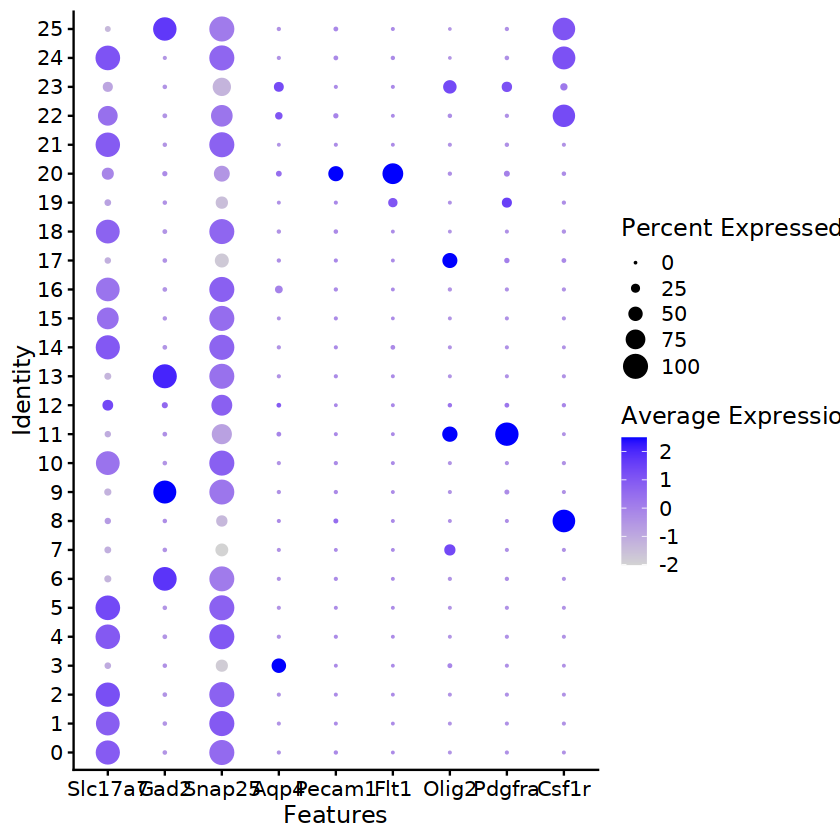

In [11]:
DotPlot(Astro_GR_snRNA_merge_join, features = c('Slc17a7',
                                                'Gad2',
                                                'Snap25',
                                                'Aqp4',
                                                'Pecam1',
                                                'Flt1',
                                                'Olig2',
                                                'Pdgfra',
                                                'Csf1r'))

In [15]:
# Separate non-neuronal, ExN and InN for re-clustering
Astro_GR_snRNA_merge_join_InN <- subset(Astro_GR_snRNA_merge_join, subset = seurat_clusters %in% c(6,9,13,25))

Astro_GR_snRNA_merge_join_Non <- subset(Astro_GR_snRNA_merge_join, subset = seurat_clusters %in% c(3,7,8,11,17,19,20,23))

Astro_GR_snRNA_merge_join_ExN <- subset(Astro_GR_snRNA_merge_join, subset = seurat_clusters %in% c(0,
                                                                                          1,
                                                                                          2,
                                                                                          4,
                                                                                          5,
                                                                                          10,
                                                                                          12,
                                                                                          14,
                                                                                          15,
                                                                                          16,
                                                                                          18,
                                                                                          21,
                                                                                          22,
                                                                                          24))

# Re-cluster excitatory neurons

In [20]:
Astro_GR_snRNA_merge_join_ExN <- RunPCA(Astro_GR_snRNA_merge_join_ExN)
Astro_GR_snRNA_merge_join_ExN <- RunUMAP(Astro_GR_snRNA_merge_join_ExN, dims = 1:15)
Astro_GR_snRNA_merge_join_ExN <- FindNeighbors(Astro_GR_snRNA_merge_join_ExN, dims = 1:15)
Astro_GR_snRNA_merge_join_ExN <- FindClusters(Astro_GR_snRNA_merge_join_ExN, resolution = 0.3)

PC_ 1 
Positive:  Cdh18, Grik3, Foxp2, Thsd7b, Dlc1, Htr1f, Zfpm2, Sdk2, Slc35f1, Bcl11b 
	   Sema3e, Rai14, Nrp1, Tle4, Plcxd3, Grm8, Galnt9, Igsf21, Hs3st2, Esrrg 
	   Slc35f3, A830018L16Rik, Vxn, Col5a1, Nfia, Mgat4c, Tmem178, Hs3st4, Hcn1, Mctp1 
Negative:  Pdzrn3, Hs6st3, Cux2, Kcnb2, Lingo2, Unc5d, Cacna2d3, Prr16, Nectin3, Tafa1 
	   Kcnh5, Sphkap, Fstl4, Rasgrf2, Kctd16, Cux1, Tafa2, A830036E02Rik, Pparg, Pde7b 
	   Epha6, Myo16, Itga4, Gm20754, Exph5, Nwd2, Cdh8, Cpne4, Spats2l, Rskr 
PC_ 2 
Positive:  Cdh12, Frmpd4, Hs3st4, Gm26871, Chsy3, Cadps2, Trhde, Unc5d, Mlip, Kctd16 
	   Efna5, Ano3, Homer1, Agbl4, Etl4, Sgcz, Zmat4, Kcnh5, Fstl4, Cdh8 
	   Brinp3, Celf4, Slc35f4, Lin7a, A830036E02Rik, Ipcef1, Hs6st3, Chrm3, Gm28905, Arhgap10 
Negative:  Qk, Zbtb20, Maml2, Dock1, Mertk, Npas3, Itpr2, Nckap5, Tmcc3, Zfp608 
	   Luzp2, Chd7, Erbin, Ptprz1, Lpp, Slc1a3, Sox6, Abca1, Epb41l2, Bmp2k 
	   Plekhg1, Gpc5, Frmd4b, Stard13, Pard3b, Tcf7l2, Daam2, Myo6, Phka1, Slc6a1 
PC_ 3 
Pos

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 76243
Number of edges: 2432769

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9459
Number of communities: 16
Elapsed time: 40 seconds


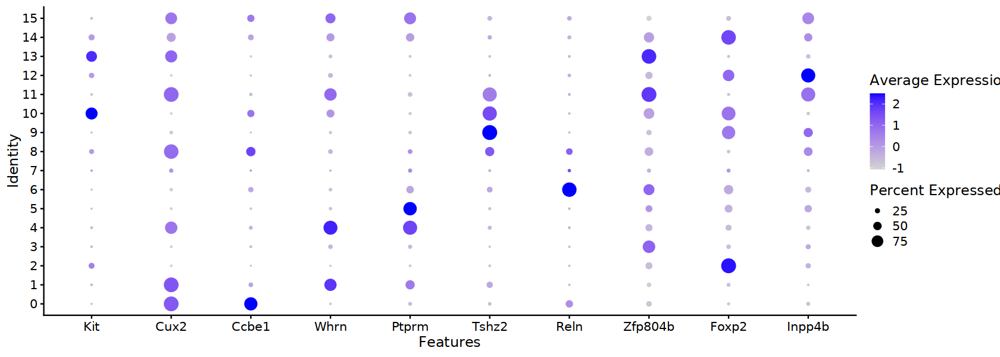

In [27]:
options(repr.plot.width=14, repr.plot.height=5)

DotPlot(Astro_GR_snRNA_merge_join_ExN,features=c('Kit',
                                                 'Cux2',
                                                 'Ccbe1',
                                                 'Whrn',
                                                 'Ptprm',
                                                 'Tshz2',
                                                 'Reln',
                                                 'Zfp804b',
                                                 'Foxp2',
                                                 'Inpp4b'))

In [39]:
# Remove ambiguous cells (predicted doublets or low-quality nuclei)
Astro_GR_snRNA_merge_join_ExN <- RenameIdents(Astro_GR_snRNA_merge_join_ExN,
             '0'  = 'L2/3',
             '1'  = 'L4',
             '2'  = 'L6CT',
             '3'  = 'L6IT',
             '4'  = 'L4',
             '5'  = 'L5IT',
             '6'  = 'L5PT',
             '7'  = 'NA',
             '8'  = 'L2/3',
             '9'  = 'L5NP',
             '10' = 'NA',
             '11' = 'NA',
             '12' = 'L6b',
             '13' = 'NA',
             '14' = 'NA',
             '15' = 'NA')
Astro_GR_snRNA_merge_join_ExN_filt <- Astro_GR_snRNA_merge_join_ExN[,!(Idents(Astro_GR_snRNA_merge_join_ExN)=='NA')]

In [51]:
saveRDS(Astro_GR_snRNA_merge_join_ExN_filt, '/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/Astro_GR_snRNA_merge_join_ExN_filt.rds')

# Re-cluster inhibitory neurons

In [52]:
Astro_GR_snRNA_merge_join_InN <- RunPCA(Astro_GR_snRNA_merge_join_InN)
Astro_GR_snRNA_merge_join_InN <- RunUMAP(Astro_GR_snRNA_merge_join_InN, dims = 1:15)
Astro_GR_snRNA_merge_join_InN <- FindNeighbors(Astro_GR_snRNA_merge_join_InN, dims = 1:15)
Astro_GR_snRNA_merge_join_InN <- FindClusters(Astro_GR_snRNA_merge_join_InN, resolution = 0.3)

PC_ 1 
Positive:  Pde4b, Gm49678, Gm26871, Pde1a, Slc24a4, Slit3, Mlip, Ldb2, Rgs6, Slc1a2 
	   Arhgap10, Tafa1, Grm3, Ptprk, Cadps2, Kcnip3, Meis2, 9130024F11Rik, Ipcef1, Homer1 
	   Nwd2, Ano3, St6galnac3, Ephb1, Adcy2, Ptn, Dpy19l1, Gabra2, Prkg1, Mapk4 
Negative:  Kcnmb2, Btbd11, Gad1, Gad2, Vwc2, Kcnip1, Dlx6os1, Rbms3, 6330411D24Rik, Erbb4 
	   Ankrd55, Kcnc2, Cntnap3, Grip1, Nhs, Gm1604a, Afap1, Nxph1, Galntl6, A530058N18Rik 
	   Alk, Tmem132c, Cacna2d2, Maf, Lhx6, Gm31218, Gpr176, Ank1, Eya4, Pde5a 
PC_ 2 
Positive:  6330411D24Rik, Tmem132c, Myo5b, Cacna2d2, Eya4, Slit2, Gm31218, Oprd1, Cemip, Syt2 
	   Gm26633, Mypn, Cntnap3, Dock4, Sox6, Gm1604a, Lhx6, Tmem132cos, Nek7, Iqgap2 
	   Tmem44, Flt3, Cntnap4, Gm13629, 9630002D21Rik, Adgra3, Runx2, Gm1604b, Myo1e, Mkx 
Negative:  Adarb2, Igf1, Vip, Kit, Dlx6os1, Prox1, Pde11a, Adra1b, Cpne7, B130024G19Rik 
	   Sema3c, Synpr, Sorcs3, Cnr1, Dlx1, Trpc7, Prox1os, C130073E24Rik, Egfr, Npas1 
	   Hcrtr2, Pld5, Chrna7, Tnfaip8l3, Shisa6,

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 10482
Number of edges: 348817

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9346
Number of communities: 14
Elapsed time: 1 seconds


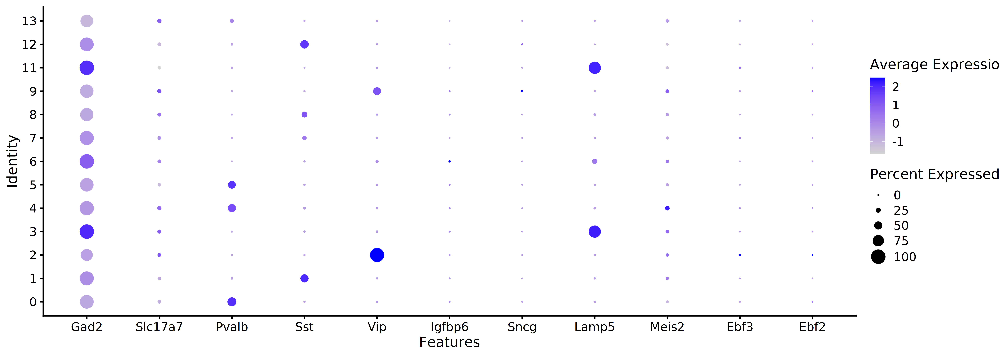

In [19]:
options(repr.plot.width=14, repr.plot.height=5)
DotPlot(Astro_GR_snRNA_merge_join_InN_filt,
        group.by='seurat_clusters',
        features=c('Gad2','Slc17a7','Pvalb','Sst','Vip','Igfbp6','Sncg','Lamp5','Meis2','Ebf3','Ebf2'))

In [62]:
# Remove ambiguous cells (predicted doublets or low-quality nuclei)
Astro_GR_snRNA_merge_join_InN <- RenameIdents(Astro_GR_snRNA_merge_join_InN,
             '0'  = 'Pvalb',
             '1'  = 'Sst',
             '2'  = 'Vip',
             '3'  = 'Lamp5',
             '4'  = 'Pvalb',
             '5'  = 'Pvalb',
             '6'  = 'Vip',
             '7'  = 'Sst',
             '8'  = 'Sst',
             '9'  = 'Vip',
             '10' = 'NA',
             '11' = 'Lamp5',
             '12' = 'Sst',
             '13' = 'ChC')
Astro_GR_snRNA_merge_join_InN_filt <- Astro_GR_snRNA_merge_join_InN[,!(Idents(Astro_GR_snRNA_merge_join_InN)=='NA')]

In [64]:
# Save object
saveRDS(Astro_GR_snRNA_merge_join_InN_filt, '/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/Astro_GR_snRNA_merge_join_InN_filt.rds')

# Re-cluster non-neuronal cells

In [66]:
Astro_GR_snRNA_merge_join_Non <- RunPCA(Astro_GR_snRNA_merge_join_Non)
Astro_GR_snRNA_merge_join_Non <- RunUMAP(Astro_GR_snRNA_merge_join_Non, dims = 1:15)
Astro_GR_snRNA_merge_join_Non <- FindNeighbors(Astro_GR_snRNA_merge_join_Non, dims = 1:15)
Astro_GR_snRNA_merge_join_Non <- FindClusters(Astro_GR_snRNA_merge_join_Non, resolution = 0.3)

PC_ 1 
Positive:  Gli3, Gm6145, Prex2, Nwd1, Prdm16, Atp1a2, Nhsl1, Slco1c1, Ntsr2, Gm3764 
	   Slc39a12, Slc1a3, Gli2, Arhgef26, Slc1a2, Rgs20, Phkg1, Atp13a4, Rfx4, Slc7a10 
	   Plpp3, Grin2c, Sparcl1, Acsbg1, Plcd4, Htra1, Bmpr1b, Gpc5, Ptprz1, Slc4a4 
Negative:  Elmo1, Dock10, Bin1, Ankrd44, Inpp5d, Apbb1ip, Dock2, Dock8, Gm2629, Rffl 
	   Ikzf1, Fyb, Chn2, Csf1r, Gm10790, Pla2g4a, Slco2b1, Tmeff2, Hpgds, Siglech 
	   Runx1, Fli1, Ly86, Hexb, Mbp, Cx3cr1, St18, Plxdc2, P2ry12, Cyth4 
PC_ 2 
Positive:  Inpp5d, Dock8, Dock2, Gm2629, Ikzf1, Gm10790, Csf1r, Slco2b1, Hpgds, P2ry12 
	   Fli1, Hexb, Siglech, Ly86, Runx1, Fyb, Lyn, Abca9, Apbb1ip, Cyth4 
	   Cx3cr1, Zfhx3, Arhgap45, Adap2, Fcrls, Cfh, Ifitm10, Pik3ap1, Maml3, Fgd2 
Negative:  St18, 1700047M11Rik, Mobp, Mog, Tspan2, Gjc3, Fa2h, Sec14l5, Ugt8a, Mag 
	   Plp1, Rnf220, Mbp, Cldn11, Plekhh1, Cldn14, Prima1, Prr5l, Phldb1, Aspa 
	   Gm16168, Gm10863, Plekhg3, Kndc1, Opalin, D7Ertd443e, Elovl7, Ermn, Insc, Arhgef10 
PC_ 3 
Positi

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 23069
Number of edges: 793785

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9476
Number of communities: 16
Elapsed time: 5 seconds


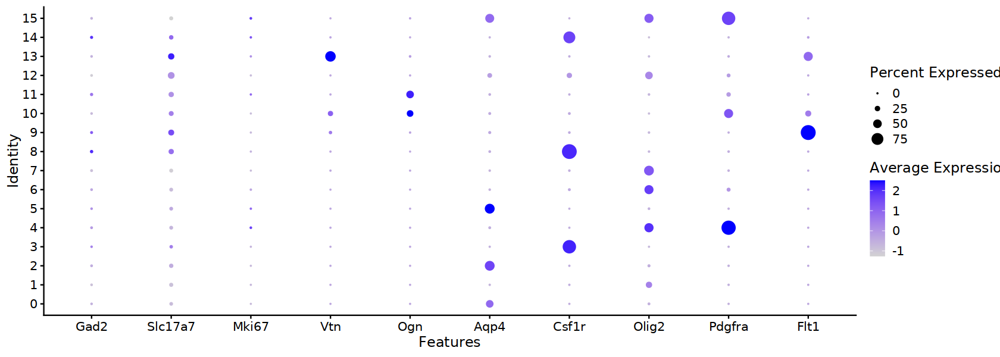

In [70]:
options(repr.plot.width=14, repr.plot.height=5)
DotPlot(Astro_GR_snRNA_merge_join_Non,features=c('Gad2','Slc17a7','Mki67','Vtn','Ogn','Aqp4','Csf1r','Olig2','Pdgfra','Flt1'))

In [77]:
# Remove ambiguous cells (predicted doublets or low-quality nuclei)
Astro_GR_snRNA_merge_join_Non <- RenameIdents(Astro_GR_snRNA_merge_join_Non,
             '0'  = 'Astro',
             '1'  = 'Oligo',
             '2'  = 'Astro',
             '3'  = 'Micro',
             '4'  = 'OPC',
             '5'  = 'Astro',
             '6'  = 'Oligo',
             '7'  = 'Oligo',
             '8'  = 'Micro',
             '9'  = 'Endo',
             '10' = 'VLMC',
             '11' = 'NA',
             '12' = 'NA',
             '13' = 'SMC-Peri',
             '14' = 'Micro',
             '15' = 'NA')
Astro_GR_snRNA_merge_join_Non_filt <- Astro_GR_snRNA_merge_join_Non[,!(Idents(Astro_GR_snRNA_merge_join_Non)=='NA')]

In [79]:
saveRDS(Astro_GR_snRNA_merge_join_Non_filt, '/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/Astro_GR_snRNA_merge_join_Non_filt.rds')

In [80]:
# Add identity as cell type metadata
Astro_GR_snRNA_merge_join_Non_filt$Celltype <- Idents(Astro_GR_snRNA_merge_join_Non_filt)
Astro_GR_snRNA_merge_join_InN_filt$Celltype <- Idents(Astro_GR_snRNA_merge_join_InN_filt)
Astro_GR_snRNA_merge_join_ExN_filt$Celltype <- Idents(Astro_GR_snRNA_merge_join_ExN_filt)

In [81]:
# Merge re-clustered object into final object
Astro_GR_snRNA_merge_join_anno <- merge(Astro_GR_snRNA_merge_join_ExN_filt, y=c(Astro_GR_snRNA_merge_join_Non_filt,
                                                                                Astro_GR_snRNA_merge_join_InN_filt))

In [83]:
# Save final object
saveRDS(Astro_GR_snRNA_merge_join_anno, '/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/Astro_GR_snRNA_merge_join_anno.rds')

# Re-plot UMAP after sub-clustering

In [2]:
# Read in object
Astro_GR_snRNA_merge_join_anno <- readRDS('/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/Astro_GR_snRNA_merge_join_anno.rds')

In [3]:
# Join layers
Astro_GR_snRNA_merge_join_anno <- JoinLayers(Astro_GR_snRNA_merge_join_anno)

# Repeat processing on merged object
Astro_GR_snRNA_merge_join_anno <- NormalizeData(Astro_GR_snRNA_merge_join_anno)
Astro_GR_snRNA_merge_join_anno <- FindVariableFeatures(Astro_GR_snRNA_merge_join_anno, selection.method = "vst", nfeatures = 2000)
Astro_GR_snRNA_merge_join_anno <- ScaleData(Astro_GR_snRNA_merge_join_anno,
                                  vars.to.regress=c('nCount_RNA','nFeature_RNA'))
Astro_GR_snRNA_merge_join_anno <- RunPCA(Astro_GR_snRNA_merge_join_anno)
Astro_GR_snRNA_merge_join_anno <- RunUMAP(Astro_GR_snRNA_merge_join_anno, dims = 1:15)

Normalizing layer: counts

Finding variable features for layer counts

Regressing out nCount_RNA, nFeature_RNA

Centering and scaling data matrix

Warning message:
“Different features in new layer data than already exists for scale.data”
PC_ 1 
Positive:  Gli3, Gm6145, Slc1a3, Nwd1, Atp1a2, Prex2, Plpp3, Nhsl1, Prdm16, Slco1c1 
	   Ntsr2, Gli2, Slc39a12, Arhgef26, Ptprz1, Daam2, Gpc5, Bcan, Rfx4, Htra1 
	   Phkg1, Gm3764, Atp13a4, Slc7a10, Sparcl1, Rgs20, Acsbg1, Fgd6, Grin2c, Lama2 
Negative:  Elmo1, Rapgef5, Inpp5d, Dock2, Dock8, Gm2629, Ikzf1, Apbb1ip, Gm10790, Csf1r 
	   Fyb, Frmpd4, Hpgds, Slco2b1, Runx1, Siglech, Fli1, Hexb, Ly86, Cx3cr1 
	   P2ry12, Maml3, Mctp1, Abca9, Cyth4, Chn2, Arhgap45, Fcrls, Lpcat2, Adap2 
PC_ 2 
Positive:  Asic2, Adcy2, Rora, Slc1a2, Frmpd4, Rgs6, Tenm3, Gm26871, Mertk, Kctd16 
	   Cdh12, Trpm3, Mapk4, Agbl4, Fat3, Celf4, Gabra2, Cacnb2, Mctp1, Galnt18 
	   Gria1, Cacng3, Grm3, Efna5, Chrm3, Slc4a4, Rreb1, Cdh8, Ano3, Pitpnc1 
Negative:  St18, 1700047M1

In [68]:
# Set class name
Astro_GR_snRNA_merge_join_anno$Class <- ifelse(Astro_GR_snRNA_merge_join_anno$Celltype %in% c('Astro',
                                                                                             'Endo',
                                                                                             'Micro',
                                                                                             'Oligo',
                                                                                             'OPC',
                                                                                             'SMC-Peri',
                                                                                             'VLMC'), 'Non-neuronal',
                                               ifelse(Astro_GR_snRNA_merge_join_anno$Celltype %in% c('ChC',
                                                                                                     'Lamp5',
                                                                                                     'Pvalb',
                                                                                                     'Sst',
                                                                                                     'Vip'),'InN','ExN'))

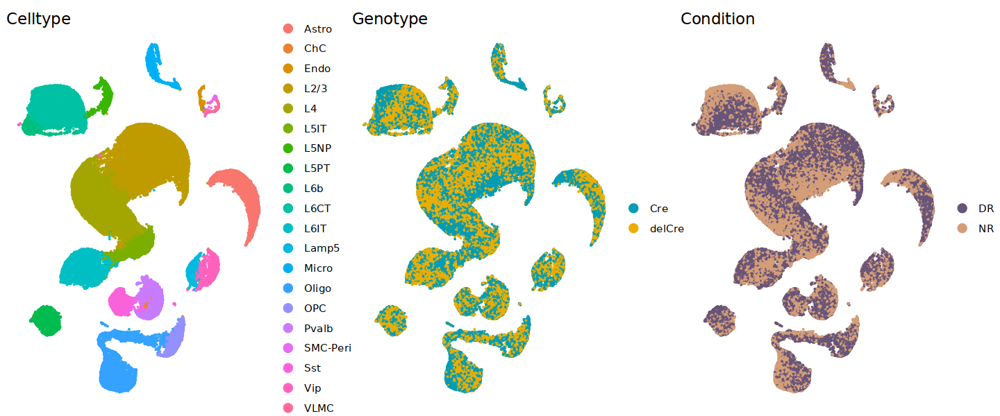

In [5]:
# Combine into single plot
options(repr.plot.width = 12 , repr.plot.height = 5)

p1 <- DimPlot(Astro_GR_snRNA_merge_join_anno,group.by='Celltype',raster=FALSE,shuffle=TRUE) + theme_void()
p2 <- DimPlot(Astro_GR_snRNA_merge_join_anno,group.by='Genotype',raster=FALSE,shuffle=TRUE,cols = rev(c('#EBAE00','#019CB5'))) + theme_void()
p3 <- DimPlot(Astro_GR_snRNA_merge_join_anno,group.by='Condition',raster=FALSE,shuffle=TRUE,cols = c("#675478","#D49E78")) + theme_void()

p1 + p2 + p3

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


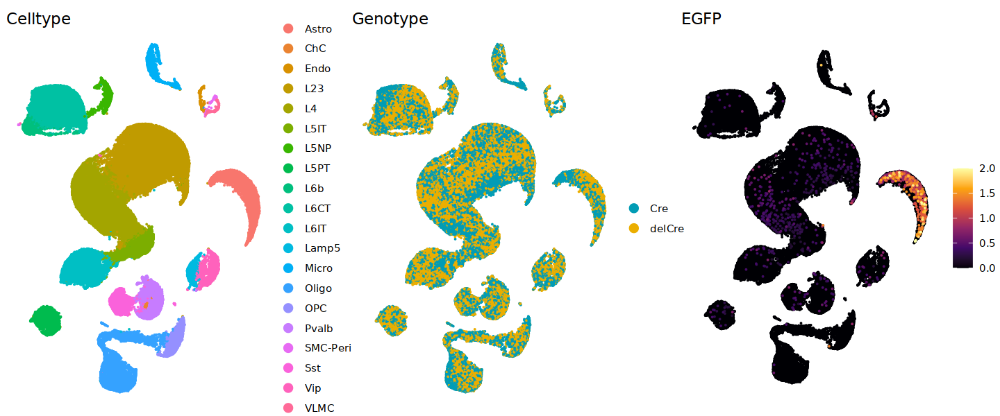

In [172]:
options(repr.plot.width = 12, repr.plot.height = 5)
p1 <- DimPlot(Astro_GR_snRNA_merge_join_anno,group.by='Celltype',raster=FALSE,shuffle=TRUE) + theme_void()
p2 <- DimPlot(Astro_GR_snRNA_merge_join_anno,group.by='Genotype',raster=FALSE,shuffle=TRUE,cols = rev(c('#EBAE00','#019CB5'))) + theme_void()
p3 <- FeaturePlot(Astro_GR_snRNA_merge_join_anno,features='EGFP',order=T,raster=F,max.cutoff = 2) + theme_void() + 
scale_color_viridis_c(option='B')

p1 + p2 + p3

In [281]:
Astro_GR_snRNA_merge_join_anno$Class <- gsub('Non-neuronal','Non', Astro_GR_snRNA_merge_join_anno$Class)

In [75]:
# Save object with UMAP
saveRDS(Astro_GR_snRNA_merge_join_anno, '/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/Astro_GR_snRNA_merge_join_anno_UMAP.rds')

# Plot final UMAPs

In [2]:
# Read in RDS
Astro_GR_snRNA_merge_join_anno <- readRDS('/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/Astro_GR_snRNA_merge_join_anno_UMAP.rds')

In [129]:
# Load in BICCN color scheme
BICCN_metadata <- fread('/n/groups/neuroduo/Bruno/Postnatal_SHARE_seq/metadata.csv',nThread = 10)
col_df <- data.frame(subtype = unique(BICCN_metadata$subclass_label),
          color = unique(BICCN_metadata$subclass_color))

In [141]:
# Set matching color names
col_df_filt <- col_df[col_df$subtype %in% c('L2/3 IT CTX',
                             'L4/5 IT CTX',
                             'L5 IT CTX',
                             'L5/6 NP CTX',
                             'L5 PT CTX',
                             'L6 IT CTX',
                             'L6 CT CTX',
                             'L6b CTX',
                             'Pvalb',
                             'Sst',
                             'Sst Chodl',
                             'Lamp5',
                             'Meis2',
                             'Vip',
                             'CR',
                             'Astro',
                             'Endo',
                             'Micro-PVM',
                             'Oligo',
                             'SMC-Peri',
                             'VLMC'),]

col_df_filt$subtype <- c('Pvalb',
                         'Lamp5',
                         'Vip',
                         'Sst',
                         'L4',
                         'Meis2',
                         'L5NP',
                         'L5PT',
                         'Sst Chodl',
                         'L2/3',
                         'L5IT',
                         'L6IT',
                         'L6CT',
                         'L6b',
                         'Oligo',
                         'CR',
                         'Astro',
                         'SMC-Peri',
                         'Micro',
                         'Endo',
                         'VLMC')



df <- data.frame(subtype  = c('OPC'),
           color = c('#675c00'))
col_df_filt <- rbind(col_df_filt, df)
col_df_filt[col_df_filt$subtype == 'CR','color'] <- '#ba6190'
col_df_filt[col_df_filt$subtype == 'Meis2','color'] <- '#e07a00'

# Subset for subtypes in dataset
col_df_filt <- col_df_filt[col_df_filt$subtype %in% Astro_GR_snRNA_merge_join_anno$Celltype,]

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


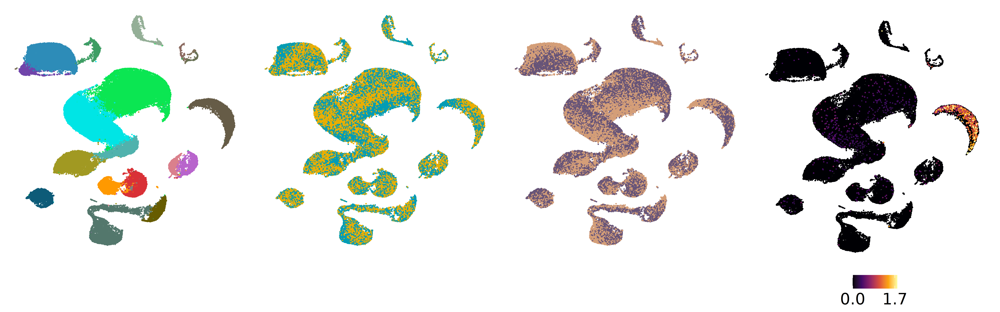

In [144]:
# Generate UMAP plots
options(repr.plot.width = 16*1.1, repr.plot.height = 5*1.1,repr.plot.res=500)

Astro_GR_snRNA_merge_join_anno$Celltype <- factor(Astro_GR_snRNA_merge_join_anno$Celltype, levels = col_df_filt$subtype)

p1 <- DimPlot(Astro_GR_snRNA_merge_join_anno,group.by='Celltype',raster=FALSE,shuffle=TRUE,cols=col_df_filt$color) + 
theme_void() + theme(legend.position='none', plot.title=element_blank(),plot.margin = margin(0, 0, 65, 0))

p2 <- DimPlot(Astro_GR_snRNA_merge_join_anno,group.by='Genotype',raster=FALSE,shuffle=TRUE,cols = rev(c('#EBAE00','#019CB5'))) + 
theme_void() + theme(legend.position='none', plot.title=element_blank(),plot.margin = margin(0, 0, 65, 0))

Astro_GR_snRNA_merge_join_anno$Condition <- factor(Astro_GR_snRNA_merge_join_anno$Condition, levels = c('DR','NR'))
p3 <- DimPlot(Astro_GR_snRNA_merge_join_anno,group.by='Condition',raster=FALSE,shuffle=TRUE,cols = c("#675478","#D49E78")) + 
theme_void() + theme(legend.position='none', plot.title=element_blank(),plot.margin = margin(0, 0, 65, 0))

p4 <- FeaturePlot(Astro_GR_snRNA_merge_join_anno,features='EGFP',order=T,raster=F,min.cutoff=0,max.cutoff = 1.8) + 
theme_void() + 
scale_color_viridis_c(option='B',breaks=c(0,1.7)) + theme(legend.position='bottom', 
                                          legend.text = element_text(size=20),
                                          legend.key.width = unit(4,'mm'),
                                          plot.title=element_blank()) 

cowplot::plot_grid(p1,p2,p3,p4,ncol=4)

# Plot QC plots

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.


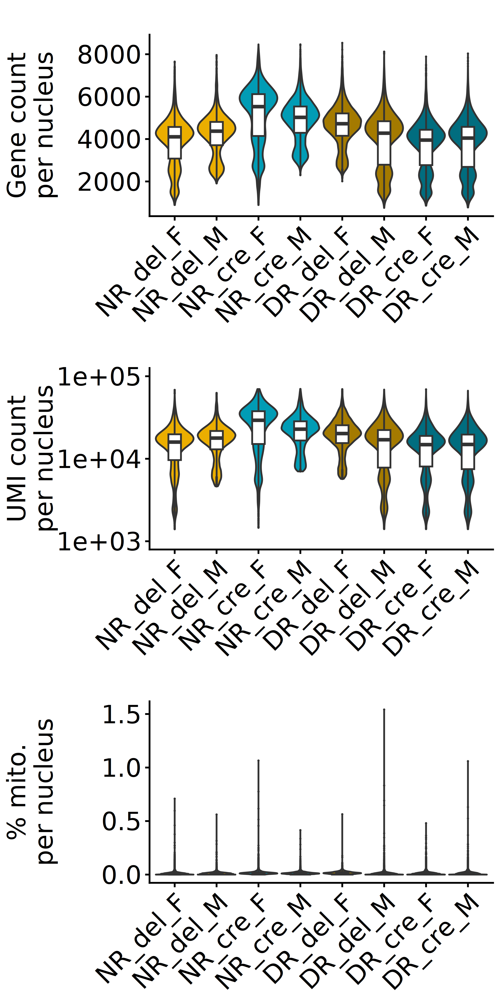

In [283]:
# Generate QC violin plots
options(repr.plot.width = 5.5, repr.plot.height = 11,repr.plot.res=500)

Astro_GR_snRNA_merge_join_anno$orig.ident <- factor(Astro_GR_snRNA_merge_join_anno$orig.ident, levels =
                                                    c('NR_del_F',
                                                      'NR_del_M',
                                                      'NR_cre_F',
                                                      'NR_cre_M',
                                                      'DR_del_F',
                                                      'DR_del_M',
                                                      'DR_cre_F',
                                                      'DR_cre_M'))
p1 <- VlnPlot(Astro_GR_snRNA_merge_join_anno, group.by = 'orig.ident', features='nFeature_RNA',pt.size=0, 
              cols = rev(rep(c(darken('#019CB5',0.3,space = "HLS"),
                      darken('#EBAE00',0.3,space = "HLS"),
                      '#019CB5',
                      '#EBAE00'),each=2))) + 
geom_boxplot(fill='white',width=0.3,outlier.size=0) + 
theme(legend.position='none',
      plot.margin = unit(c(0,0,-10,0), "cm"),
      axis.title.y=element_text(margin=margin(0,5,0,0)),
      axis.title.x=element_blank(),
      axis.text=element_text(size=20),axis.title=element_text(size=20)) + ggtitle('') + ylab('Gene count\nper nucleus')

p2 <- VlnPlot(Astro_GR_snRNA_merge_join_anno, group.by = 'orig.ident', features='nCount_RNA',pt.size=0,
             cols = rev(rep(c(darken('#019CB5',0.3,space = "HLS"),
                      darken('#EBAE00',0.3,space = "HLS"),
                      '#019CB5',
                      '#EBAE00'),each=2))) + 
geom_boxplot(fill='white',width=0.3,outlier.size=0) + 
theme(legend.position='none',
      plot.margin = unit(c(0,0,-10,0), "cm"),
      axis.title.y=element_text(margin=margin(0,10,0,0)),
      axis.title.x=element_blank(),
      axis.text=element_text(size=20),axis.title=element_text(size=20)) + 
ggtitle('') + 
ylab('UMI count\nper nucleus') & scale_y_log10(limits=c(1000,100000),breaks = c(1000,10000,100000))

p3 <- VlnPlot(Astro_GR_snRNA_merge_join_anno, group.by = 'orig.ident', features='percent.mt',pt.size=0,
             cols = rev(rep(c(darken('#019CB5',0.3,space = "HLS"),
                      darken('#EBAE00',0.3,space = "HLS"),
                      '#019CB5',
                      '#EBAE00'),each=2))) + 
geom_boxplot(fill='white',width=0.3,outlier.size=0) + 
theme(legend.position='none',
      plot.margin=margin(-10,0,0,0),
      axis.title.x=element_blank(),
      axis.text=element_text(size=20),axis.title=element_text(size=20)) + ggtitle('') + ylab('% mito.\nper nucleus')

cowplot::plot_grid(p1,p2,p3,ncol=1, align='hv')

# Plot marker gene dot plots

In [14]:
# Read in object
Astro_GR_snRNA_merge_join_anno <- readRDS('/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/Astro_GR_snRNA_merge_join_anno_UMAP.rds')

In [15]:
# Combine ChC with PV
Astro_GR_snRNA_merge_join_anno$Celltype2 <- ifelse(Astro_GR_snRNA_merge_join_anno$Celltype == 'ChC', 'Pvalb', 
                                                   Astro_GR_snRNA_merge_join_anno$Celltype)

In [17]:
# Set cell type labels for plotting
Astro_GR_snRNA_merge_join_anno$Celltype_plotting <- gsub('Pvalb', 'PV+', Astro_GR_snRNA_merge_join_anno$Celltype2)
Astro_GR_snRNA_merge_join_anno$Celltype_plotting <- gsub('Sst', 'Sst+', Astro_GR_snRNA_merge_join_anno$Celltype_plotting)
Astro_GR_snRNA_merge_join_anno$Celltype_plotting <- gsub('Vip', 'Vip+', Astro_GR_snRNA_merge_join_anno$Celltype_plotting)
Astro_GR_snRNA_merge_join_anno$Celltype_plotting <- gsub('Lamp5', 'Lamp5+', Astro_GR_snRNA_merge_join_anno$Celltype_plotting)

Astro_GR_snRNA_merge_join_anno$Celltype_plotting <- factor(Astro_GR_snRNA_merge_join_anno$Celltype_plotting, levels = 
                                                  c('L2/3',
                                                   'L4',
                                                   'L5IT',
                                                   'L5NP',
                                                   'L5PT',
                                                   'L6IT',
                                                   'L6CT',
                                                   'L6b',
                                                   'PV+',
                                                   'Sst+',
                                                   'Vip+',
                                                   'Lamp5+',
                                                   'Astro',
                                                    'Endo',
                                                    'Micro',
                                                    'OPC',
                                                   'Oligo',
                                                   'SMC-Peri',
                                                   'VLMC'))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


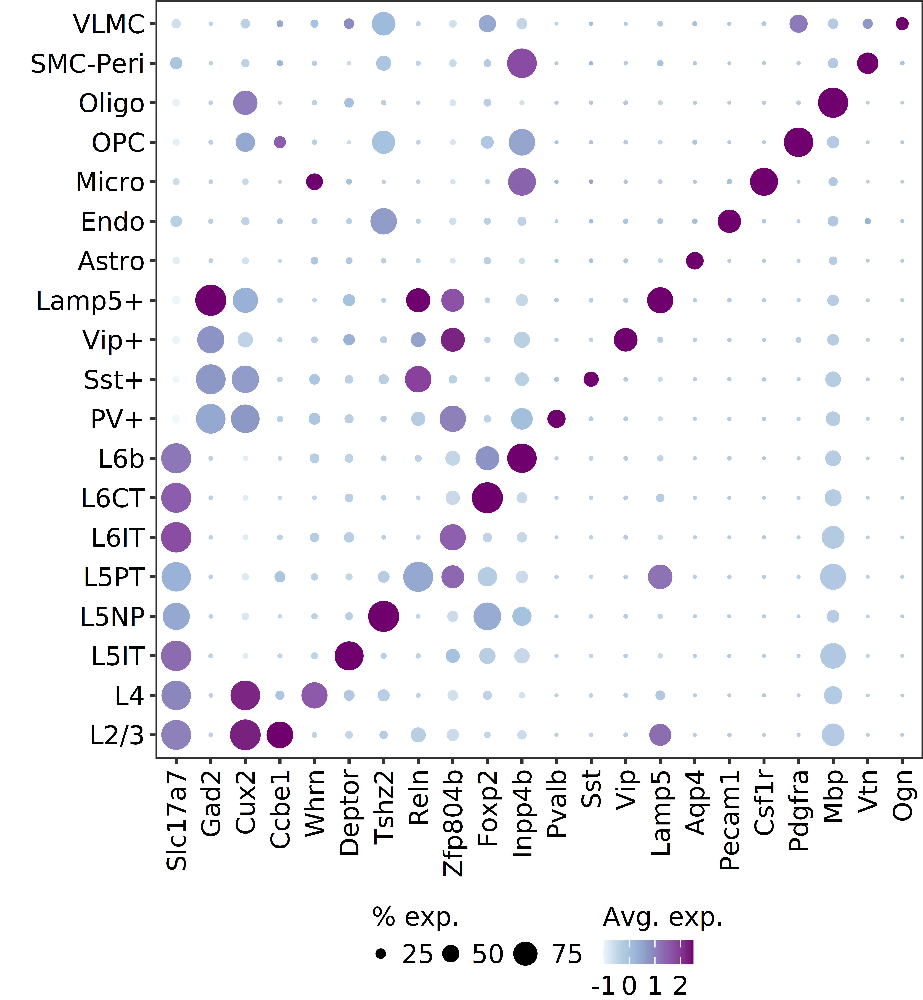

In [19]:
# Generate plots
options(repr.plot.width = 6 , repr.plot.height = 6.5,repr.plot.res=900)

DotPlot(Astro_GR_snRNA_merge_join_anno,
        group.by='Celltype_plotting',
        features = c('Slc17a7',
                     'Gad2',
                     'Cux2',
                     'Ccbe1',
                     'Whrn',
                     'Deptor',
                     'Tshz2',
                     'Reln',
                     'Zfp804b',
                     'Foxp2',
                     'Inpp4b',
                     'Pvalb',
                     'Sst',
                     'Vip',
                     'Lamp5',
                     'Aqp4',
                     'Pecam1',
                     'Csf1r',
                     'Pdgfra',
                     'Mbp',
                     'Vtn',
                     'Ogn')) + ylab('') + xlab('') + theme_bw() + theme(axis.text = element_text(color ='black',size=12),
                                                                              axis.text.x = element_text(face = 'italic',
                                                                              angle=90,
                                                                              vjust=0.5,
                                                                              hjust=1),
                                                                        legend.position='bottom',
                                                                        legend.text = element_text(size=12),
                                                                        legend.title = element_text(size=12),
                                                                        legend.key.height=unit(4,'mm'),
                                                                        legend.key.width=unit(3,'mm'),
                                                                        legend.margin=margin(-5,0,0,0),
                                                                        plot.margin=margin(0,0,0,0),
                                                                              panel.grid.major = element_blank(),
                                                                              panel.grid.minor = element_blank()) + scale_colour_distiller(palette="BuPu",direction=0) +
guides(color = guide_colorbar(title.position = "top"),
      size = guide_legend(title.position='top')) + labs(color = 'Avg. exp.', size = '% exp.')

# Run differential expression analysis

In [2]:
# Read in object
Astro_GR_snRNA_merge_join_anno <- readRDS('/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/Astro_GR_snRNA_merge_join_anno_UMAP.rds')

In [3]:
# 1) Subset cell type, 2) aggregate expression per replicate, 3) generate edgeR DGEList object, 4) run edgeR QLFLRT test

In [4]:
# Add group 
Astro_GR_snRNA_merge_join_anno$group <- paste0(Astro_GR_snRNA_merge_join_anno$Condition, '_', 
                                               Astro_GR_snRNA_merge_join_anno$Genotype)

# Fix L2/3 name
Astro_GR_snRNA_merge_join_anno$Celltype <- str_replace(Astro_GR_snRNA_merge_join_anno$Celltype, 'L2/3', 'L23')

In [5]:
# Combine ChC & PV for DEG analysis
Astro_GR_snRNA_merge_join_anno_v2 <- Astro_GR_snRNA_merge_join_anno
Astro_GR_snRNA_merge_join_anno_v2$Celltype <- str_replace(Astro_GR_snRNA_merge_join_anno_v2$Celltype, 'ChC', 'Pvalb')

In [401]:
# Run differential expression analysis with edgeR
NR_DR_del_list <- list()
NR_cre_del_list <- list()
DR_cre_del_list <- list()

for (i in unique(Astro_GR_snRNA_merge_join_anno_v2$Celltype)) {
    # Create counts dataframe
    mat <- as.data.frame(AggregateExpression(subset(Astro_GR_snRNA_merge_join_anno_v2, subset = Celltype == i),group.by='orig.ident'))

    mat <- mat[,c('RNA.DR.cre.F','RNA.DR.cre.M',
                  'RNA.DR.del.F','RNA.DR.del.M',
                  'RNA.NR.cre.F','RNA.NR.cre.M',
                  'RNA.NR.del.F','RNA.NR.del.M')]
    df <- data.frame(Condition=c(rep('DR',4),rep('NR',4)),
                       Genotype=c(rep('cre',2),rep('delCre',2),
                                  rep('cre',2),rep('delCre',2)),
                       Group=c('DR_cre','DR_cre','DR_delCre','DR_delCre',
                               'NR_cre','NR_cre','NR_delCre','NR_delCre'),
                       Sex=c('F','M','F','M','F','M','F','M'))
    
    # Filter by rowSums greater than expression cutoff in at least 2 samples (smallest group size)
    smallestGroupSize <- 2
    threshold <- mean(colSums(mat) * 0.00002)
    keep <- rowSums(mat >= threshold) >= smallestGroupSize
    mat_filt <- mat[keep,]
    
    # Create edgeR object
    y <- DGEList(counts=mat_filt, samples = df, group = df$Group)

    # Normalize, create model, estimate dispersions
    y <- normLibSizes(y)
    design <- model.matrix(~ 0 + df$Group)
    y <- estimateDisp(y, design)
    fit <- glmQLFit(y, design)

    # Export results for all possible pairwise comparisons
    ## DR cre vs del
    QLF_test <- glmLRT(fit, contrast=c(1,-1,0,0))
    qlf.DR.cre <- as.data.frame(topTags(QLF_test,n=Inf))

    ## NR cre vs del
    QLF_test <- glmLRT(fit, contrast=c(0,0,1,-1))
    qlf.NR.cre <- as.data.frame(topTags(QLF_test,n=Inf))

    ## NR delcre vs DR delcre
    QLF_test <- glmLRT(fit, contrast=c(0,1,0,-1))
    qlf.NR.DR.del <- as.data.frame(topTags(QLF_test,n=Inf))
    
    # Save to list
    DR_cre_del_list[[i]] <- qlf.DR.cre
    NR_cre_del_list[[i]] <- qlf.NR.cre
    NR_DR_del_list[[i]] <- qlf.NR.DR.del
}

In [16]:
# Save results list as RDS
saveRDS(DR_cre_del_list, '/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/DR_cre_del_list.rds')
saveRDS(NR_cre_del_list, '/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/NR_cre_del_list.rds')
saveRDS(NR_DR_del_list, '/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/NR_DR_del_list.rds')

In [9]:
# Read in object
NR_cre_del_list <- readRDS('/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/NR_cre_del_list.rds')

In [10]:
# Export results to csv file
for (i in names(NR_cre_del_list)) {
    NR_cre_del_list[[i]]$gene <- rownames(NR_cre_del_list[[i]])
    NR_cre_del_list[[i]] <- NR_cre_del_list[[i]][,c(6,1,2,3,4,5)]
write.table(NR_cre_del_list[[i]],
          paste0('/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/DEG_output/',i,'_GRKOvsGRCon.csv'),
          sep=',',
          col.names=TRUE,
            row.names=FALSE,
         quote=FALSE)
    }

# Plot DEG # per cell type as a strip chart for Fig. 4

In [2]:
# Save results list as RDS
NR_cre_del_list <- readRDS('/n/groups/neuroduo/Bruno/Astro_GR_KO_snRNA/NR_cre_del_list.rds')

In [3]:
# Categorize genes based on FC & FDR
NR_cre_del_list_v2 <- lapply(NR_cre_del_list, function(x) {
    x$category <- ifelse((x$logFC > 0) & (x$FDR < 0.05), 'Up',
           ifelse((x$logFC < 0) & (x$FDR < 0.05), 'Down', 'ns'))
    
    return(x)
})

# Add a new column with the name of the list element
NR_cre_del_list_v2 <- lapply(names(NR_cre_del_list_v2), function(x) {
  df <- NR_cre_del_list_v2[[x]]
  df$Celltype <- x
  return(df)
})

NR_cre_del_list_v2 <- lapply(NR_cre_del_list_v2, function(x) {
   x$gene <- rownames(x)
   return(x)
})

In [4]:
# Merge to dataframe
NR_cre_del_list_v2_rbind <- do.call(rbind,NR_cre_del_list_v2)

In [9]:
# Set plotting order
NR_cre_del_list_v2_rbind$category <- factor(NR_cre_del_list_v2_rbind$category, levels = c('Up','Down','ns'))
NR_cre_del_list_v2_rbind_order <- NR_cre_del_list_v2_rbind[rev(order(NR_cre_del_list_v2_rbind$category)),]

NR_cre_del_list_v2_rbind_order$Celltype_plotting <- gsub('Pvalb', 'PV+', NR_cre_del_list_v2_rbind_order$Celltype)
NR_cre_del_list_v2_rbind_order$Celltype_plotting <- gsub('Sst', 'Sst+', NR_cre_del_list_v2_rbind_order$Celltype_plotting)
NR_cre_del_list_v2_rbind_order$Celltype_plotting <- gsub('Vip', 'Vip+', NR_cre_del_list_v2_rbind_order$Celltype_plotting)
NR_cre_del_list_v2_rbind_order$Celltype_plotting <- gsub('Lamp5', 'Lamp5+', NR_cre_del_list_v2_rbind_order$Celltype_plotting)

# Set cell type order
NR_cre_del_list_v2_rbind_order$Celltype_plotting <- factor(NR_cre_del_list_v2_rbind_order$Celltype_plotting, levels = c('Astro',
                                                                                                      'Oligo',
                                                                                                      'OPC',
                                                                                                      'SMC-Peri',
                                                                                                      'VLMC',
                                                                                                      'Endo',
                                                                                                      'Micro',
                                                                                                      'PV+',
                                                                                                      'Sst+',
                                                                                                      'Vip+',
                                                                                                      'Lamp5+',
                                                                                                      'L23',
                                                                                                      'L4',
                                                                                                      'L5IT',
                                                                                                      'L5PT',
                                                                                                      'L5NP',
                                                                                                      'L6IT',
                                                                                                      'L6CT',
                                                                                                      'L6b' ))

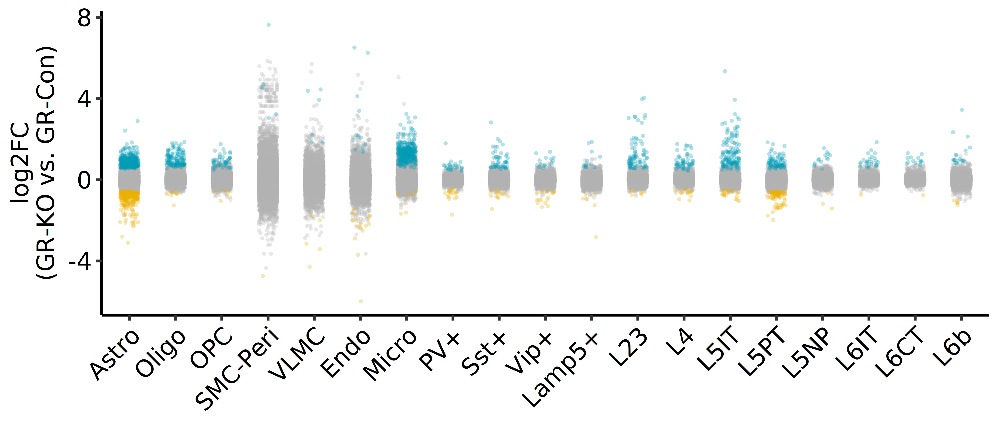

In [11]:
# Generate the plot
options(repr.plot.width=7, repr.plot.height=3,repr.plot.res=900)
ggplot(NR_cre_del_list_v2_rbind_order, aes(x=Celltype_plotting, y=logFC, color=category)) +
  geom_jitter(size=0.6,shape=16,alpha=0.3,position=position_jitter(0.2))  + theme_classic() + scale_color_manual(values = c('#019CB5','#EBAE00','grey70')) + 
ylab('log2FC\n(GR-KO vs. GR-Con)') + theme(axis.text = element_text(color='black',size=12),
                                           axis.title.x=element_blank(),
                                           axis.title = element_text(color='black',size=12),
                                           axis.text.x = element_text(angle=45, hjust=1,vjust=1), legend.position = 'none')

# Plot cell type-specific vs shared DEGs

In [6]:
# Subset genes based on differential in 1 or more excitatory neuron type
NR_cre_del_list_v2_rbind_ExN <- NR_cre_del_list_v2_rbind[NR_cre_del_list_v2_rbind$Celltype %in% c('L23',
                                                                                                  'L4',
                                                                                                  'L5IT',
                                                                                                  'L5NP',
                                                                                                  'L5PT',
                                                                                                  'L6b',
                                                                                                  'L6CT',
                                                                                                  'L6IT'),]
NR_cre_del_list_v2_rbind_ExN_sig <- NR_cre_del_list_v2_rbind_ExN[NR_cre_del_list_v2_rbind_ExN$FDR < 0.05,]

# Collect up-regulated DEGs into dataframe
NR_cre_del_list_v2_rbind_ExN_sig_up <- NR_cre_del_list_v2_rbind_ExN_sig[NR_cre_del_list_v2_rbind_ExN_sig$logFC>0,]
gene_df <- data.frame(table(NR_cre_del_list_v2_rbind_ExN_sig_up$gene))

In [7]:
# Prepare data for plotting
gene_count_df <- data.frame(table(gene_df$Freq>1))
gene_count_df$Var1 <- gsub('TRUE','Shared',gene_count_df$Var1)
gene_count_df$Var1 <- gsub('FALSE','Cell-type\nenriched',gene_count_df$Var1)
gene_count_df$Var1 <- factor(gene_count_df$Var1, levels = c('Cell-type\nenriched',
                                                           'Shared'))

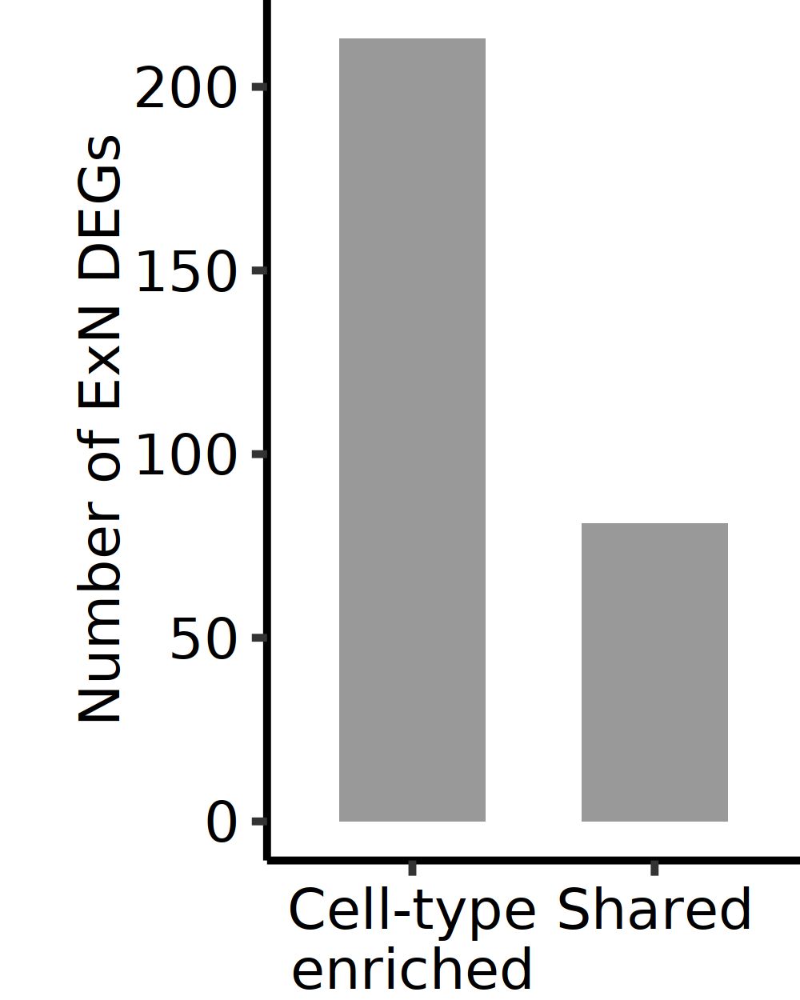

In [23]:
options(repr.plot.width=2, repr.plot.height=2.5,repr.plot.res=500)
ggplot(gene_count_df, aes(y=Freq,x=Var1)) + 
geom_bar(stat='identity',width=0.6,fill='grey60') + 
theme_classic() + ylab('Number of ExN DEGs') + theme(axis.title = element_text(color='black',size=10),
                                                               axis.text = element_text(color='black',size=10),
                                                               axis.title.x = element_blank(),
                                                               plot.margin = margin(0, 0, 0, 0.5, "cm"),
                                                              axis.text.x =element_text(size=10,angle=0))

# Run GO analysis on single vs. shared DEGs

In [2]:
# Load libraries
library(org.Mm.eg.db)
Mm <- org.Mm.eg.db

Loading required package: AnnotationDbi


Attaching package: ‘AnnotationDbi’


The following object is masked from ‘package:clusterProfiler’:

    select


The following object is masked from ‘package:dplyr’:

    select






In [9]:
# Convert gene symbols to ENTREZID
Mm <- org.Mm.eg.db
my.symbols.shared <- as.vector(gene_df[gene_df$Freq>1,'Var1'])
entrez_shared_res <- select(Mm, 
       keys = my.symbols.shared,
       columns = c("ENTREZID", "SYMBOL"),
       keytype = "SYMBOL")

my.symbols.single <- as.vector(gene_df[gene_df$Freq==1,'Var1'])
entrez_single_res <- select(Mm, 
       keys = my.symbols.single,
       columns = c("ENTREZID", "SYMBOL"),
       keytype = "SYMBOL")

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns



In [10]:
# Run BP analysis
ego_multi_BP <- enrichGO(gene = entrez_shared_res$ENTREZID,
                OrgDb         = org.Mm.eg.db,
                ont           = "BP",
                pAdjustMethod = "BH",
                readable      = TRUE)

ego_single_BP <- enrichGO(gene = entrez_single_res$ENTREZID,
                OrgDb         = org.Mm.eg.db,
                ont           = "BP",
                pAdjustMethod = "BH",
                readable      = TRUE)

In [11]:
# Re-label for space
ego_multi_BP@result$Description <- gsub('cell-cell adhesion via plasma-membrane adhesion molecules',
                                     'cell-cell adhesion via adhesion molecules',
                                     ego_multi_BP@result$Description)
ego_multi_BP@result$Description <- gsub('neuron projection guidance',
                                     'neuron projection\nguidance',
                                     ego_multi_BP@result$Description)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


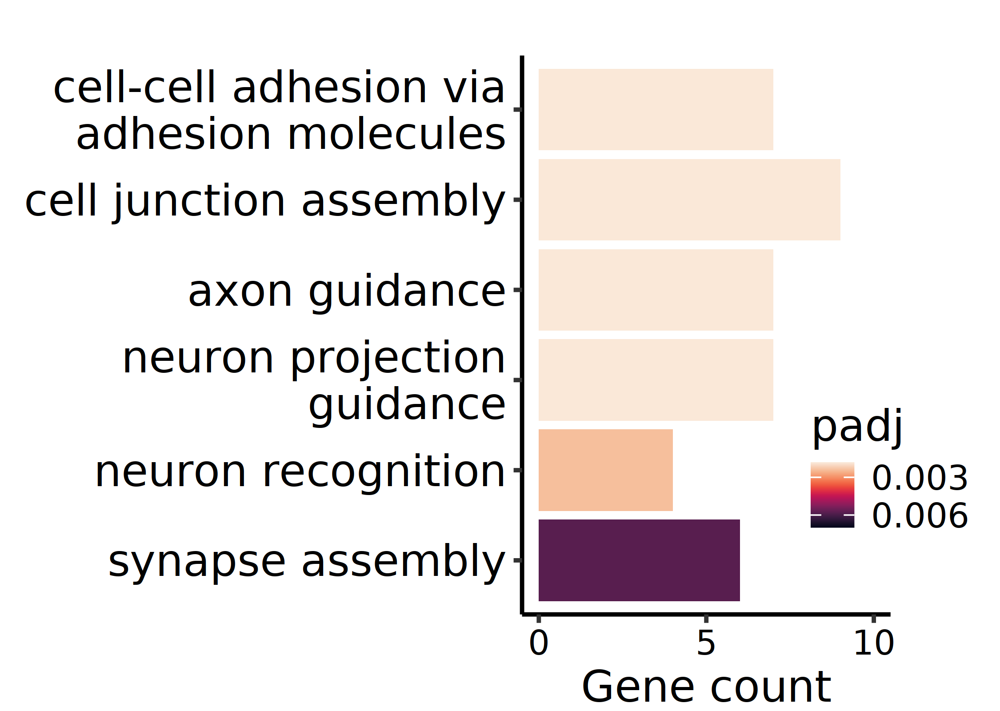

In [12]:
# Generate plot
options(repr.plot.width=4.5, repr.plot.height=3.2,repr.plot.res=500)
barplot(ego_multi_BP, showCategory=6) + theme_classic() + theme(axis.text = element_text(color = 'black',size=14),
                                                          axis.text.x = element_text(size=11),
                                                          axis.title.x = element_text(color = 'black',size=14),
                                                          legend.title = element_text(color = 'black',size=14),
                                                          legend.text = element_text(color = 'black',size=11),
                                                          legend.key.width = unit(0.5, 'cm'), 
                                                          legend.key.height = unit(0.15, 'cm'), 
                                                          plot.margin = margin(0, 0, 0, 1, "cm"),
                                                          legend.margin = margin(0.5, 0.5, -2.5,-1.3, "cm")) + xlab('Gene count') + scale_x_continuous(limits=c(0,10),breaks=c(0,5,10)) +
  scale_fill_viridis(name='padj',option='rocket', guide = guide_colorbar(reverse = TRUE), direction = -1 ,limits = c(0.0018,0.007),breaks=c(0.003,0.006))


# Plot z-scale heatmap of relevant axonal DEGs

In [6]:
# Subset L5IT neurons
L5IT <- subset(Astro_GR_snRNA_merge_join_anno_v2, subset = Celltype == 'L5IT')

Centering and scaling data matrix

Warning message:
“`legend_height` you specified is too small, use the default minimal
height.”
Warning message:
“`legend_height` you specified is too small, use the default minimal
height.”
Warning message:
“`legend_height` you specified is too small, use the default minimal
height.”


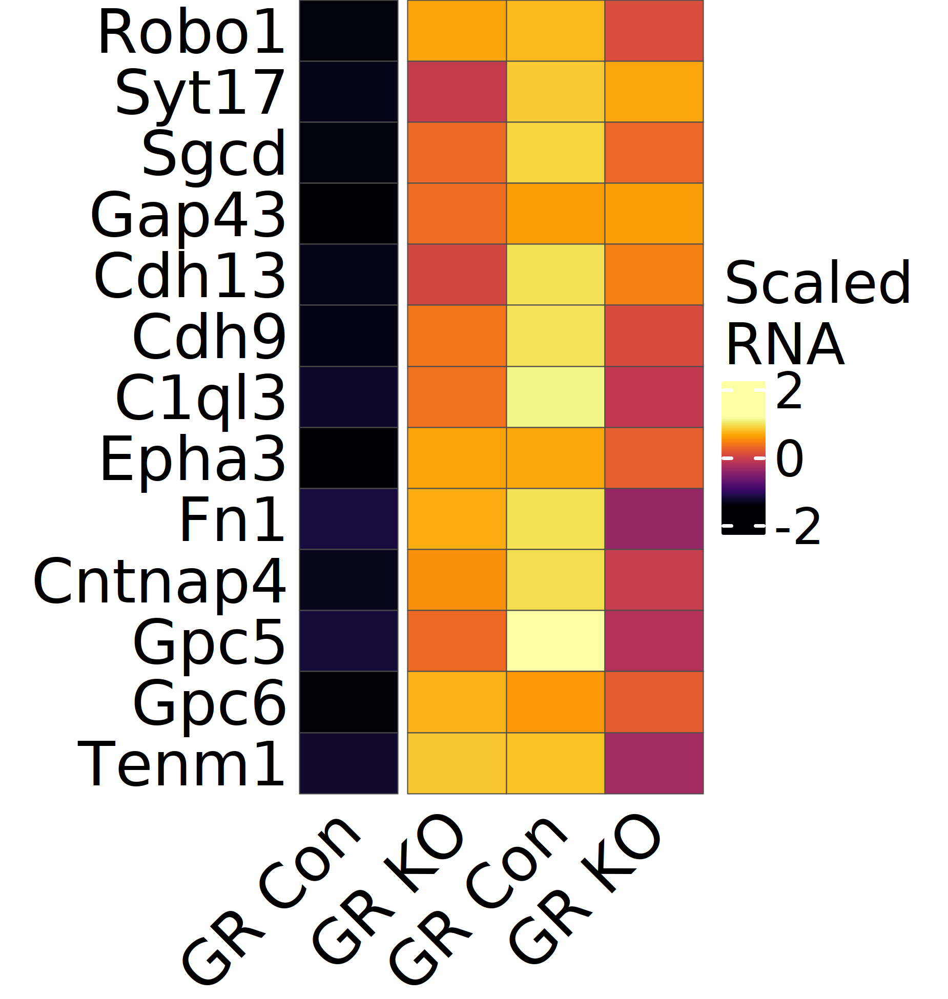

In [310]:
# Generate plot
options(repr.plot.width=3.7, repr.plot.height=3.9,repr.plot.res=500)

c_split <- data.frame(c('A',rep('B',3)))

L5IT_agg <- GetAssayData(AggregateExpression(L5IT,
                                            group.by='group',
                                            return.seurat = TRUE),
                                            slot='data')
scale_df_L5IT <- t(scale(t(L5IT_agg[c('Robo1',
                                      'Syt17',
                                      'Sgcd',
                                      'Gap43',
                                      'Cdh13',
                                      'Cdh9',
                                      'C1ql3',
                                      'Epha3',
                                      'Fn1',
                                      'Cntnap4',
                                      'Gpc5',
                                      'Gpc6',
                                      'Tenm1'),])))
scale_df_L5IT <- scale_df_L5IT[,c(4,3,2,1)]
colnames(scale_df_L5IT) <- rev(c('GR KO','GR Con','GR KO','GR Con'))

ht1 <- Heatmap(scale_df_L5IT,
        cluster_rows = FALSE,
        cluster_columns=FALSE,
        show_row_names=TRUE,
        name = "Scaled\nRNA",
        column_title = NULL,
               row_names_side = "left",
        rect_gp = gpar(col = "grey30", lwd = 0.3),
        column_split = c_split,
        column_names_rot =45,
        column_names_gp = grid::gpar(fontsize = 17),
        row_names_gp = gpar(fontface = "italic",fontsize = 17),
        heatmap_legend_param = list(legend_direction = "vertical", 
                                    legend_width = unit(0.5, "cm"),
                                    legend_height = unit(0.1, "cm"),
                                    breaks=c(-2,0,2),
                                    at=c(-2,0,2),
                                     labels_gp = gpar(fontsize = 14),
                                    title_gp = gpar(fontsize = 16),
                                    title_position = "topleft"),
        col = inferno(1000))

draw(ht1, heatmap_legend_side = "right",padding = unit(c(0, 5, 0, 5), "mm"))

# Overlap astrocyte GR-dependent DEGs across snRNA and bulk RNA experiments

In [62]:
# Load in bulk RNA results
P21_GR_dep_res <- readRDS('/n/groups/neuroduo/Bruno/Astro_NR_DR_RNA_analysis/P21_GR_dep_res.rds')
P21_GR_dep_res_relax <- readRDS('/n/groups/neuroduo/Bruno/Astro_NR_DR_RNA_analysis/P21_GR_dep_res_relax.rds')

In [178]:
# Overlap gene lists
table(rownames(NR_cre_del_list[['Astro']][NR_cre_del_list[['Astro']]$FDR<0.05,]) %in% 
      rownames(P21_GR_dep_res_relax[P21_GR_dep_res_relax$padj<0.05,]))

table(
      rownames(P21_GR_dep_res_relax[P21_GR_dep_res_relax$padj<0.05,]) %in% 
      rownames(NR_cre_del_list[['Astro']][NR_cre_del_list[['Astro']]$FDR<0.05,]) )


FALSE  TRUE 
  271   247 

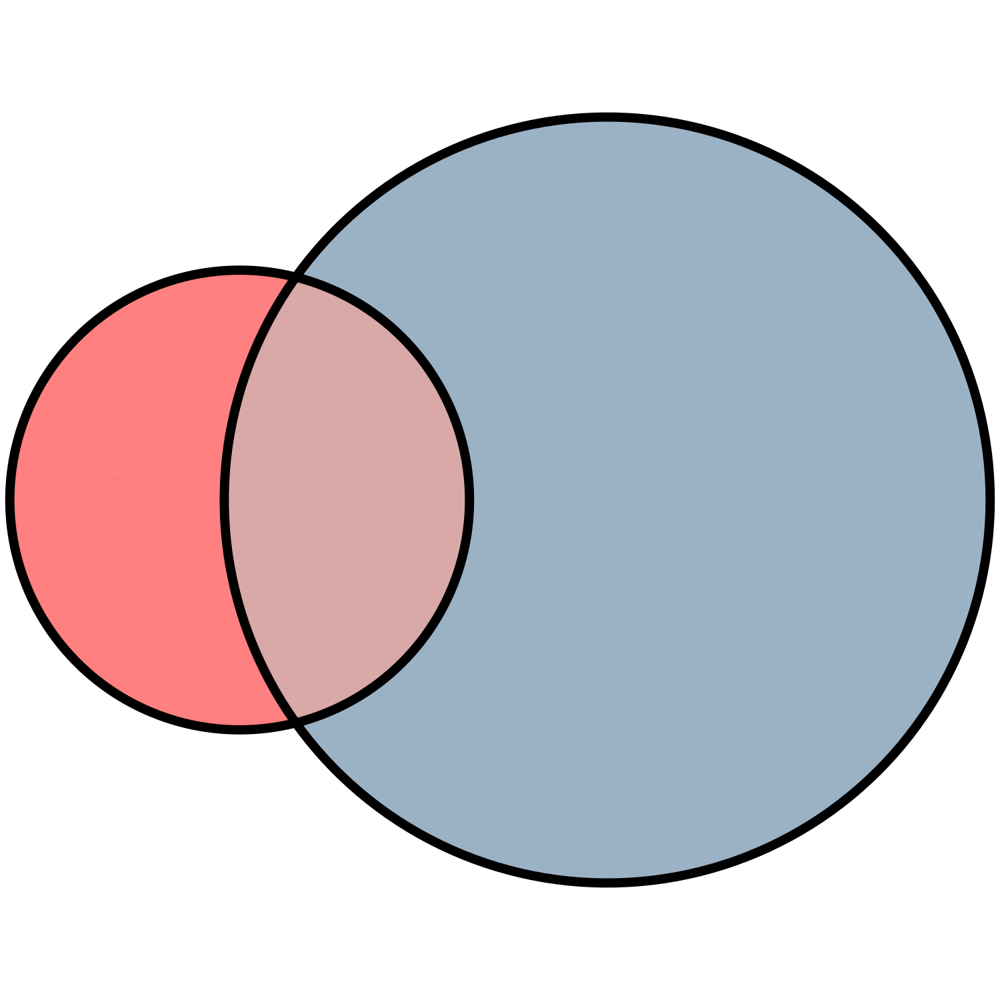

In [127]:
# Generate plots
DEG_overlap <- c(
  'snRNA' = 271,
  'Bulk' = 1191,
  "snRNA&Bulk" = 247
)

options(repr.plot.width=3, repr.plot.height=3,repr.plot.res=500)
fit3 <- euler(DEG_overlap, shape = "ellipse")
plot(fit3,
     lwd=2,
    fills = list(fill = c("red", "steelblue4"), alpha = 0.5),
     labels = list(col = "black", fontsize = 0))

In [132]:
# Also plot as cross-correlation of log2FC values
# Collect significant maturation DEGs
snRNA_astro_df <- data.frame(NR_cre_del_list[['Astro']][NR_cre_del_list[['Astro']]$FDR<0.05,])

# Collect GR-dependent genes
P21_GR_dep_res_df <- data.frame(P21_GR_dep_res)

# Combine
combine_FC_df <- data.frame(gene = rownames(snRNA_astro_df),
                            x = snRNA_astro_df$logFC,
                            y = -P21_GR_dep_res_df[rownames(snRNA_astro_df),]$log2FoldChange)

# Process data
rownames(combine_FC_df) <- combine_FC_df$gene
combine_FC_df <- combine_FC_df[,-1]
combine_FC_df$direction <- ifelse(combine_FC_df$x > 0, 'Pos', 'Neg')

Warning message:
“Removed 23 rows containing non-finite outside the scale range (`stat_smooth()`).”
Warning message:
“Removed 23 rows containing non-finite outside the scale range (`stat_cor()`).”
Warning message:
“Removed 23 rows containing missing values or values outside the scale range (`geom_point()`).”


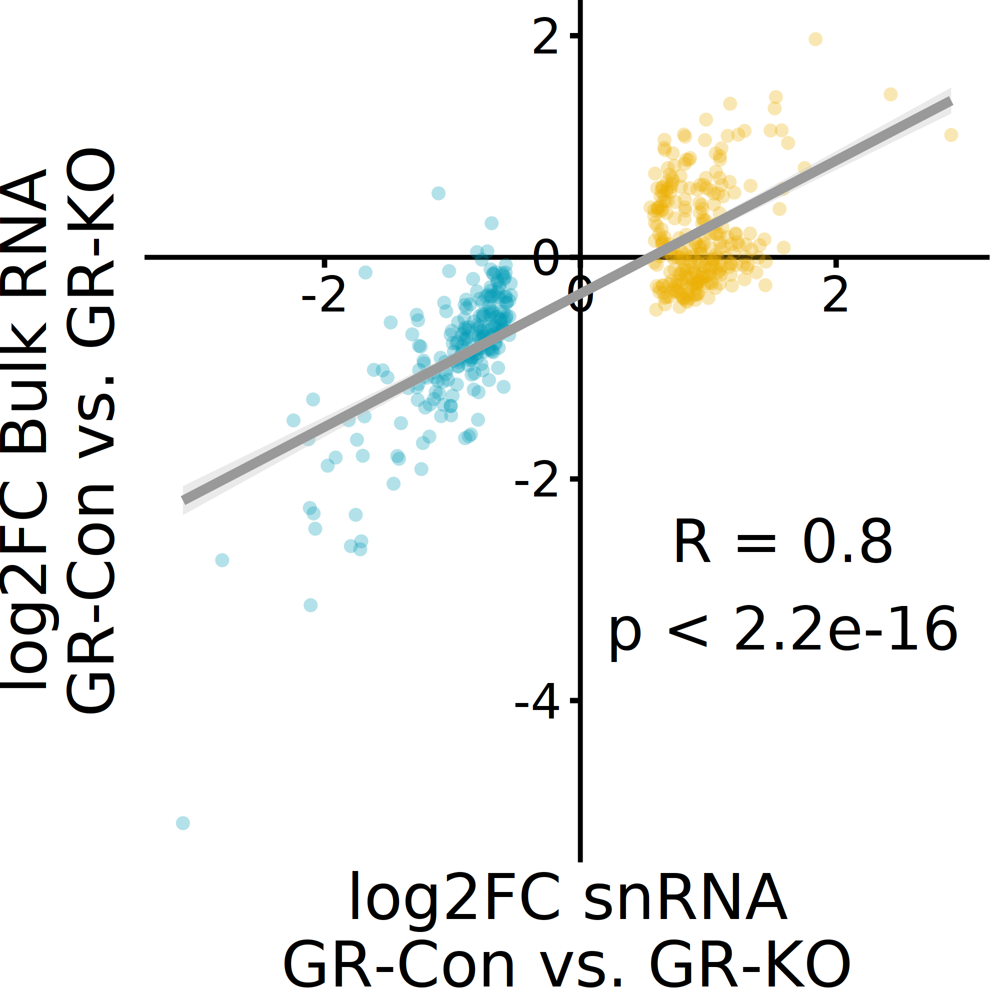

In [149]:
options(repr.plot.width=4, repr.plot.height=4,repr.plot.res=500)

ggscatter(combine_FC_df, x = "x", y = "y", color = "direction",alpha=0.3,size=1.5,shape=16,
          add = "reg.line", add.params = list(color = "grey60", fill = "grey80",linetype='solid'), conf.int = TRUE, 
          cor.coef = TRUE, cor.method = "pearson",cor.coeff.args = list(size=6,label.x = .2,label.y = -3, label.sep = "\n"),
          ylab = "log2FC Bulk RNA\nGR-Con vs. GR-KO", xlab = "log2FC snRNA\nGR-Con vs. GR-KO") + coord_axes_inside(labels_inside = TRUE) + 
        scale_color_manual(values = c('#019CB5','#EBAE00')) + theme(legend.position='none',
                                                                    axis.text = element_text(size=14),
                                                                    plot.margin = margin(0,3,0,0),
                                                                    axis.title = element_text(size=18),
                                                                    axis.title.y = element_text(margin=margin(0,5,0,0)))

# Generate example violin plots of astrocyte DEGs

In [9]:
plan("multicore", workers = 10)
options(future.globals.maxSize = 2000 * 1024^3)

In [7]:
# Subset astro
Astro <- subset(Astro_GR_snRNA_merge_join_anno_v2, subset = Celltype == 'Astro')
# Run SCTransform
Astro_SCT <- SCTransform(Astro)

In [14]:
# Set groups for plotting
Astro_SCT$group_plotting <- str_replace(str_replace(Astro_SCT$group, '_delCre', '\nGR\nCon'),  '_Cre', '\nGR\nKO')
Astro_SCT$group_plotting <- factor(Astro_SCT$group_plotting, levels =c('NR\nGR\nCon',
                                                               'NR\nGR\nKO',
                                                               'DR\nGR\nCon',
                                                               'DR\nGR\nKO'))

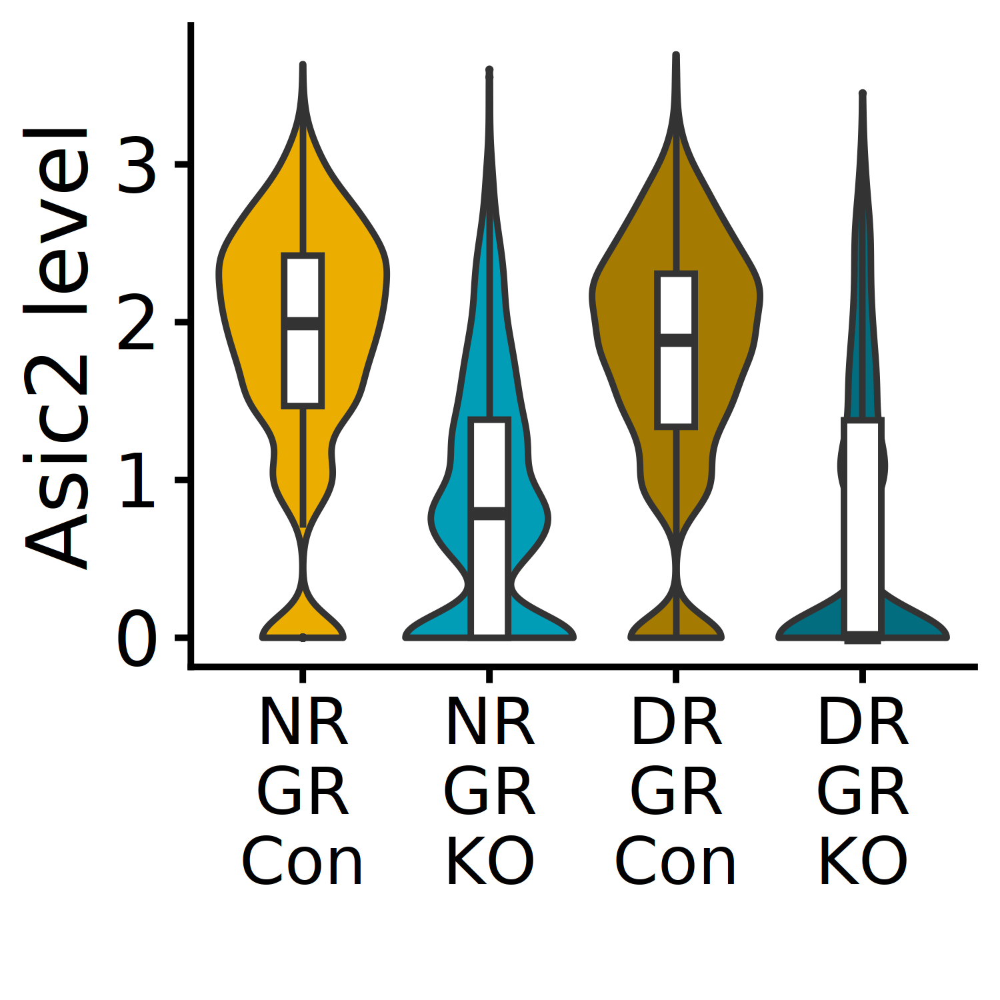

In [21]:
# Generate plot for gene of interest
options(repr.plot.width=3, repr.plot.height=3,repr.plot.res=500)

goi <- 'Asic2'
p1 <- VlnPlot(Astro_SCT, features = goi,
              group.by = 'group_plotting',
              pt.size=0,
              assay='RNA',
              alpha=0.03, cols = c('#EBAE00','#019CB5',
                                   darken('#EBAE00',0.3,space = "HLS"),
                                   darken('#019CB5',0.3,space = "HLS"))) + 
theme(legend.position = 'none',
      axis.title.y = element_text(size=18),
      axis.text.y = element_text(size=16),
      axis.text.x = element_text(size=14,angle=0,hjust=0.5),
      plot.title=element_blank(),
      plot.margin = unit(c(0,0,0,0),"cm")) + 
geom_boxplot(width=0.2,fill="white",outlier.size=0) + xlab('') + ylab(paste0(goi, ' level'))

p1

# Generate scaled expression plots for Fig. 4

In [286]:
# Subset each ExN type
L23 <- subset( Astro_GR_snRNA_merge_join_anno_v2, subset = Celltype == 'L23')
L4 <- subset( Astro_GR_snRNA_merge_join_anno_v2, subset = Celltype ==  'L4')
L5IT <- subset( Astro_GR_snRNA_merge_join_anno_v2, subset = Celltype =='L5IT')
L5NP <- subset( Astro_GR_snRNA_merge_join_anno_v2, subset = Celltype =='L5NP')
L5PT <- subset( Astro_GR_snRNA_merge_join_anno_v2, subset = Celltype =='L5PT')
L6CT <- subset( Astro_GR_snRNA_merge_join_anno_v2, subset = Celltype =='L6CT')
L6IT <- subset( Astro_GR_snRNA_merge_join_anno_v2, subset = Celltype =='L6IT')
L6b <- subset( Astro_GR_snRNA_merge_join_anno_v2, subset = Celltype == 'L6b')

In [344]:
# Aggregate expression & subset induced genes for each type
L23_agg <- GetAssayData(AggregateExpression(L23,group.by='group',return.seurat = TRUE),
                        slot='data')
L4_agg <- GetAssayData(AggregateExpression(L4,group.by='group',return.seurat = TRUE),
                        slot='data')
L5IT_agg <- GetAssayData(AggregateExpression(L5IT,group.by='group',return.seurat = TRUE),
                        slot='data')
L5NP_agg <- GetAssayData(AggregateExpression(L5NP,group.by='group',return.seurat = TRUE),
                        slot='data')
L5PT_agg <- GetAssayData(AggregateExpression(L5PT,group.by='group',return.seurat = TRUE),
                        slot='data')
L6CT_agg <- GetAssayData(AggregateExpression(L6CT,group.by='group',return.seurat = TRUE),
                        slot='data')
L6IT_agg <- GetAssayData(AggregateExpression(L6IT,group.by='group',return.seurat = TRUE),
                        slot='data')
L6b_agg <- GetAssayData(AggregateExpression(L6b,group.by='group',return.seurat = TRUE),
                        slot='data')

scale_df_L23 <- t(scale(t(L23_agg[rownames(NR_cre_del_list[['L23']][(NR_cre_del_list[['L23']]$FDR < 0.05) & 
                                                                    (NR_cre_del_list[['L23']]$logFC >0),]),])))[,c(4,3,2,1)]
scale_df_L4 <- t(scale(t(L4_agg[rownames(NR_cre_del_list[['L4']][(NR_cre_del_list[['L4']]$FDR < 0.05) & 
                                                                    (NR_cre_del_list[['L4']]$logFC >0),]),])))[,c(4,3,2,1)]
scale_df_L5IT <- t(scale(t(L5IT_agg[rownames(NR_cre_del_list[['L5IT']][(NR_cre_del_list[['L5IT']]$FDR < 0.05) & 
                                                                    (NR_cre_del_list[['L5IT']]$logFC >0),]),])))[,c(4,3,2,1)]
scale_df_L5NP <- t(scale(t(L5NP_agg[rownames(NR_cre_del_list[['L5NP']][(NR_cre_del_list[['L5NP']]$FDR < 0.05) & 
                                                                    (NR_cre_del_list[['L5NP']]$logFC >0),]),])))[,c(4,3,2,1)]
scale_df_L5PT <- t(scale(t(L5PT_agg[rownames(NR_cre_del_list[['L5PT']][(NR_cre_del_list[['L5PT']]$FDR < 0.05) & 
                                                                    (NR_cre_del_list[['L5PT']]$logFC >0),]),])))[,c(4,3,2,1)]
scale_df_L6CT <- t(scale(t(L6CT_agg[rownames(NR_cre_del_list[['L6CT']][(NR_cre_del_list[['L6CT']]$FDR < 0.05) & 
                                                                    (NR_cre_del_list[['L6CT']]$logFC >0),]),])))[,c(4,3,2,1)]
scale_df_L6IT <- t(scale(t(L6IT_agg[rownames(NR_cre_del_list[['L6IT']][(NR_cre_del_list[['L6IT']]$FDR < 0.05) & 
                                                                    (NR_cre_del_list[['L6IT']]$logFC >0),]),])))[,c(4,3,2,1)]
scale_df_L6b <- t(scale(t(L6b_agg[rownames(NR_cre_del_list[['L6b']][(NR_cre_del_list[['L6b']]$FDR < 0.05) & 
                                                                    (NR_cre_del_list[['L6b']]$logFC >0),]),])))[,c(4,3,2,1)]

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix



In [320]:
# Re-label colnames for plotting
colnames(scale_df_L23) <- c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO')
colnames(scale_df_L4) <- c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO')
colnames(scale_df_L5IT) <- c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO')
colnames(scale_df_L5NP) <- c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO')
colnames(scale_df_L5PT) <- c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO')
colnames(scale_df_L6IT) <- c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO')
colnames(scale_df_L6CT) <- c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO')
colnames(scale_df_L6b) <- c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO')

In [321]:
# Melt
scale_df_L23_melt <- reshape2::melt(scale_df_L23)
scale_df_L4_melt <- reshape2::melt(scale_df_L4)
scale_df_L5IT_melt <- reshape2::melt(scale_df_L5IT)
scale_df_L5NP_melt <- reshape2::melt(scale_df_L5NP)
scale_df_L5PT_melt <- reshape2::melt(scale_df_L5PT)
scale_df_L6IT_melt <- reshape2::melt(scale_df_L6IT)
scale_df_L6CT_melt <- reshape2::melt(scale_df_L6CT)
scale_df_L6b_melt <- reshape2::melt(scale_df_L6b)

# Set factor level
scale_df_L23_melt$Var2 <- factor(scale_df_L23_melt$Var2, levels = c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO'))
scale_df_L4_melt$Var2 <- factor(scale_df_L4_melt$Var2, levels = c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO'))
scale_df_L5IT_melt$Var2 <- factor(scale_df_L5IT_melt$Var2, levels = c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO'))
scale_df_L5NP_melt$Var2 <- factor(scale_df_L5NP_melt$Var2, levels = c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO'))
scale_df_L5PT_melt$Var2 <- factor(scale_df_L5PT_melt$Var2, levels = c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO'))
scale_df_L6IT_melt$Var2 <- factor(scale_df_L6IT_melt$Var2, levels = c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO'))
scale_df_L6CT_melt$Var2 <- factor(scale_df_L6CT_melt$Var2, levels = c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO'))
scale_df_L6b_melt$Var2 <- factor(scale_df_L6b_melt$Var2, levels = c('NR GR-Con','NR GR-KO','DR GR-Con','DR GR-KO'))

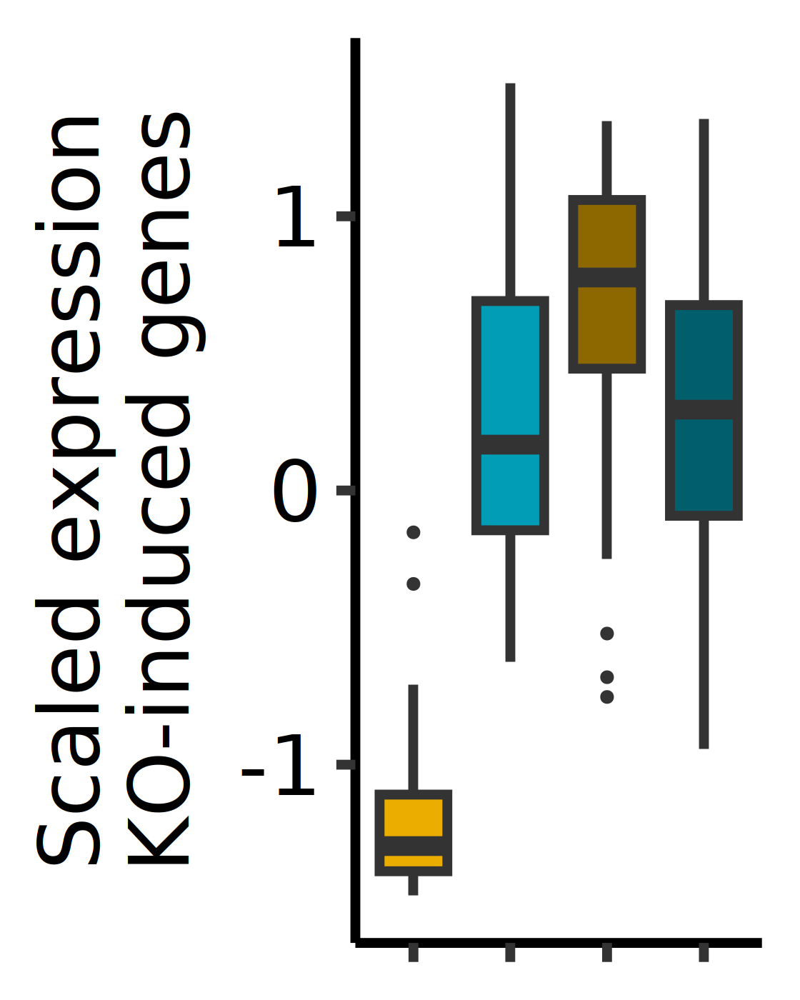

In [337]:
# Generate the plot
options(repr.plot.width=1.6, repr.plot.height=2,repr.plot.res=700)

ggplot(scale_df_L23_melt, aes(x=Var2, y=value,fill=Var2)) + geom_boxplot(width=0.7,outlier.size=0.1,color='grey20') + 
theme_classic() + 
theme(legend.position = 'none',
      axis.text=element_text(size=12,color='black'),
      axis.title.x=element_blank(),
      axis.title.y=element_text(size=12),
      axis.text.x=element_blank()) + 
scale_fill_manual(values=c('#EBAE00',
                          '#019CB5',
                          darken('#EBAE00',0.4,space = "HLS"),
                          darken('#019CB5',0.4,space = "HLS"))) + 
ylab('Scaled expression\nKO-induced genes')+ ylim(c(-1.5,1.5))

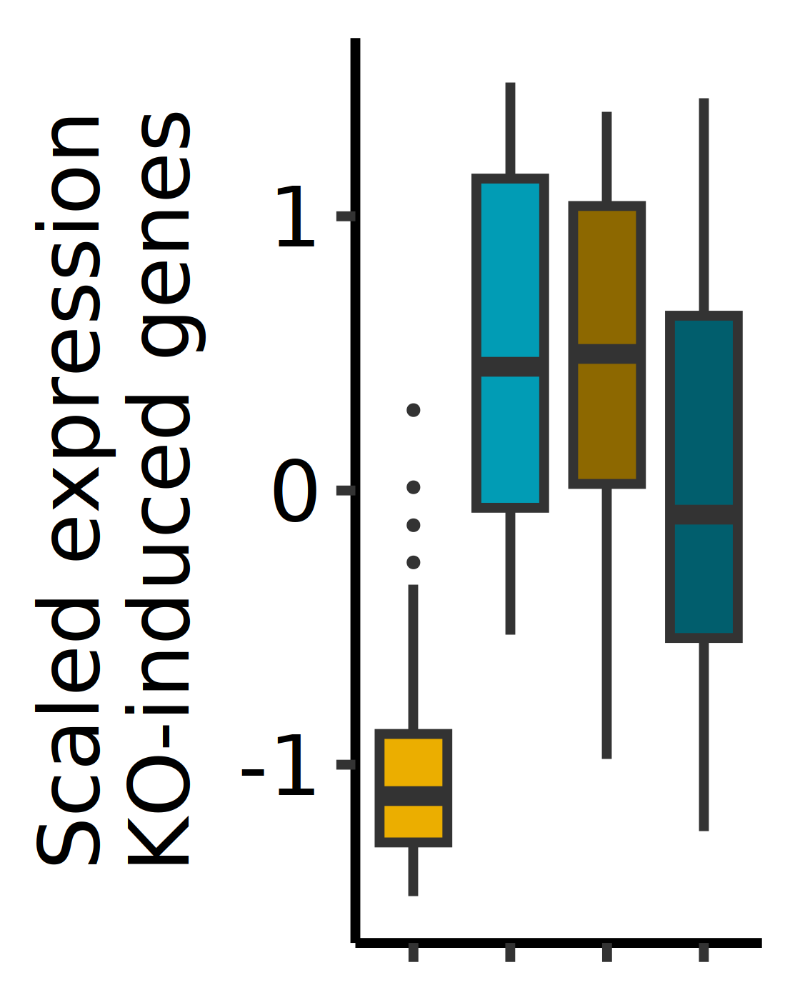

In [338]:
# Generate the plot
options(repr.plot.width=1.6, repr.plot.height=2,repr.plot.res=700)

ggplot(scale_df_L4_melt, aes(x=Var2, y=value,fill=Var2)) + geom_boxplot(width=0.7,outlier.size=0.1,color='grey20') + 
theme_classic() + 
theme(legend.position = 'none',
      axis.text=element_text(size=12,color='black'),
      axis.title.x=element_blank(),
      axis.title.y=element_text(size=12),
      axis.text.x=element_blank()) + 
scale_fill_manual(values=c('#EBAE00',
                          '#019CB5',
                          darken('#EBAE00',0.4,space = "HLS"),
                          darken('#019CB5',0.4,space = "HLS"))) + 
ylab('Scaled expression\nKO-induced genes')+ ylim(c(-1.5,1.5))

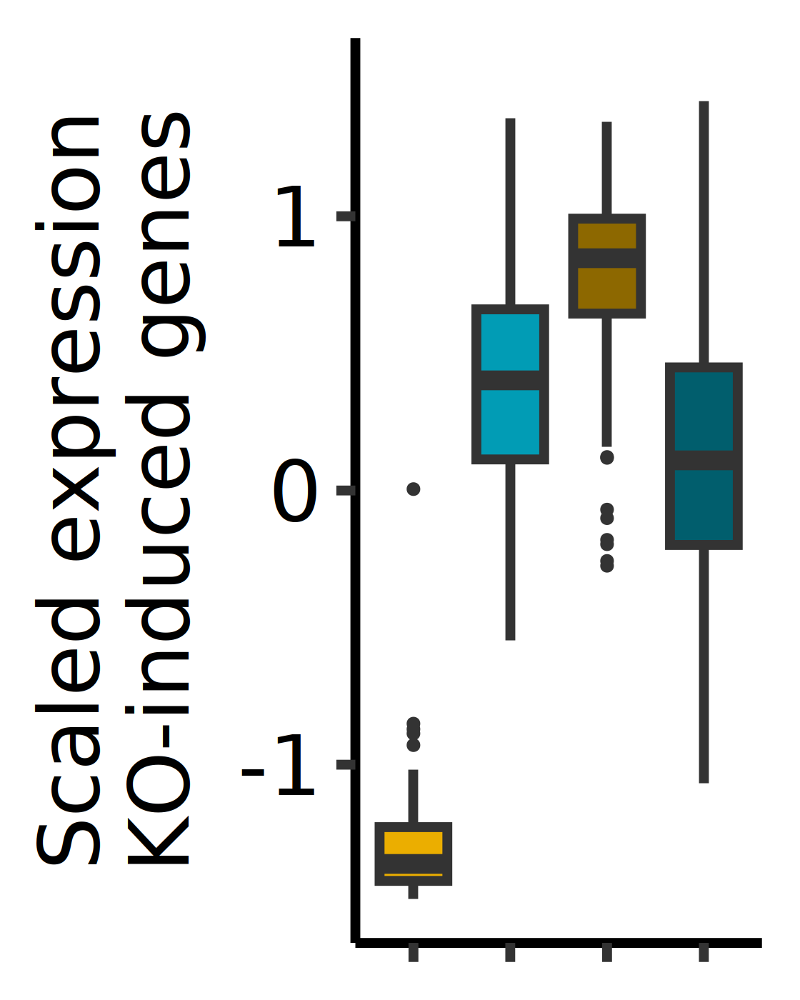

In [339]:
# Generate the plot
options(repr.plot.width=1.6, repr.plot.height=2,repr.plot.res=700)

ggplot(scale_df_L5IT_melt, aes(x=Var2, y=value,fill=Var2)) + geom_boxplot(width=0.7,outlier.size=0.1,color='grey20') + 
theme_classic() + 
theme(legend.position = 'none',
      axis.text=element_text(size=12,color='black'),
      axis.title.x=element_blank(),
      axis.title.y=element_text(size=12),
      axis.text.x=element_blank()) + 
scale_fill_manual(values=c('#EBAE00',
                          '#019CB5',
                          darken('#EBAE00',0.4,space = "HLS"),
                          darken('#019CB5',0.4,space = "HLS"))) + 
ylab('Scaled expression\nKO-induced genes')+ ylim(c(-1.5,1.5))

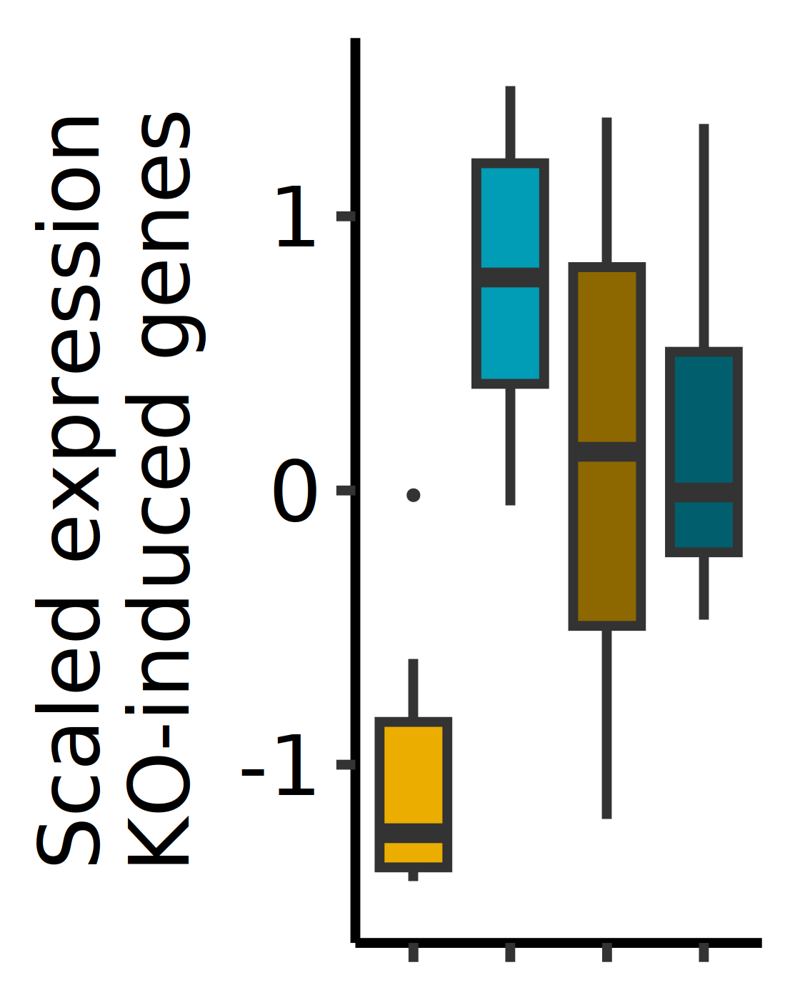

In [340]:
# Generate the plot
options(repr.plot.width=1.6, repr.plot.height=2,repr.plot.res=700)

ggplot(scale_df_L5NP_melt, aes(x=Var2, y=value,fill=Var2)) + geom_boxplot(width=0.7,outlier.size=0.1,color='grey20') + 
theme_classic() + 
theme(legend.position = 'none',
      axis.text=element_text(size=12,color='black'),
      axis.title.x=element_blank(),
      axis.title.y=element_text(size=12),
      axis.text.x=element_blank()) + 
scale_fill_manual(values=c('#EBAE00',
                          '#019CB5',
                          darken('#EBAE00',0.4,space = "HLS"),
                          darken('#019CB5',0.4,space = "HLS"))) + 
ylab('Scaled expression\nKO-induced genes')+ ylim(c(-1.5,1.5))

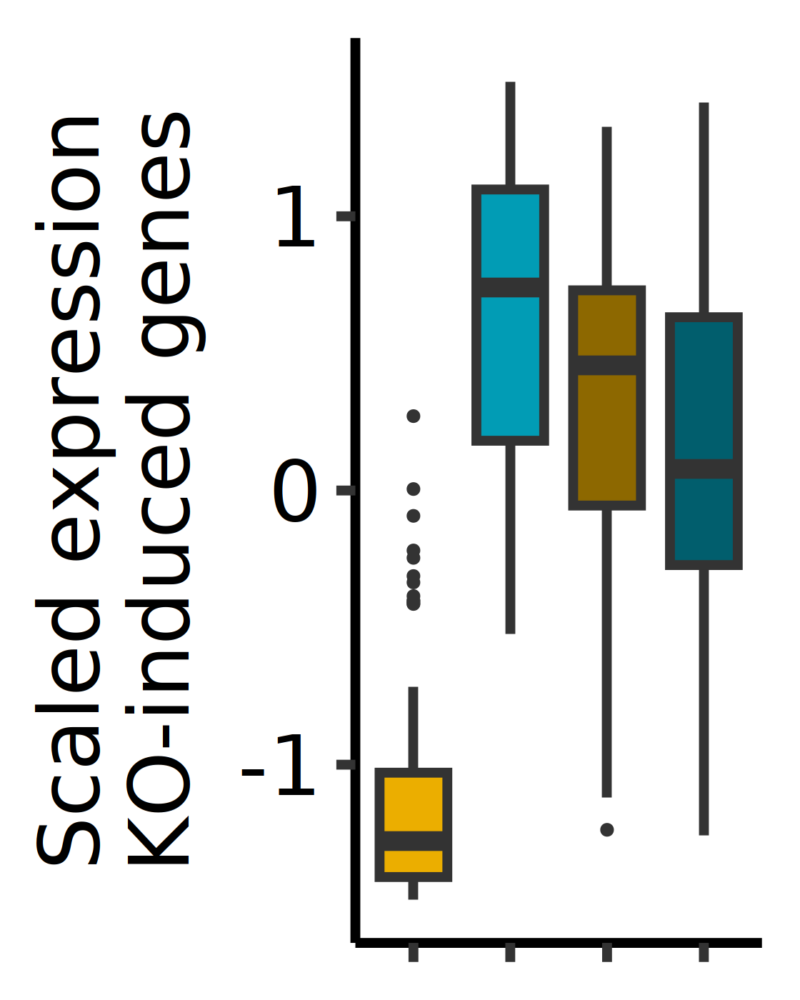

In [341]:
# Generate the plot
options(repr.plot.width=1.6, repr.plot.height=2,repr.plot.res=700)

ggplot(scale_df_L5PT_melt, aes(x=Var2, y=value,fill=Var2)) + geom_boxplot(width=0.7,outlier.size=0.1,color='grey20') + 
theme_classic() + 
theme(legend.position = 'none',
      axis.text=element_text(size=12,color='black'),
      axis.title.x=element_blank(),
      axis.title.y=element_text(size=12),
      axis.text.x=element_blank()) + 
scale_fill_manual(values=c('#EBAE00',
                          '#019CB5',
                          darken('#EBAE00',0.4,space = "HLS"),
                          darken('#019CB5',0.4,space = "HLS"))) + 
ylab('Scaled expression\nKO-induced genes')+ ylim(c(-1.5,1.5))

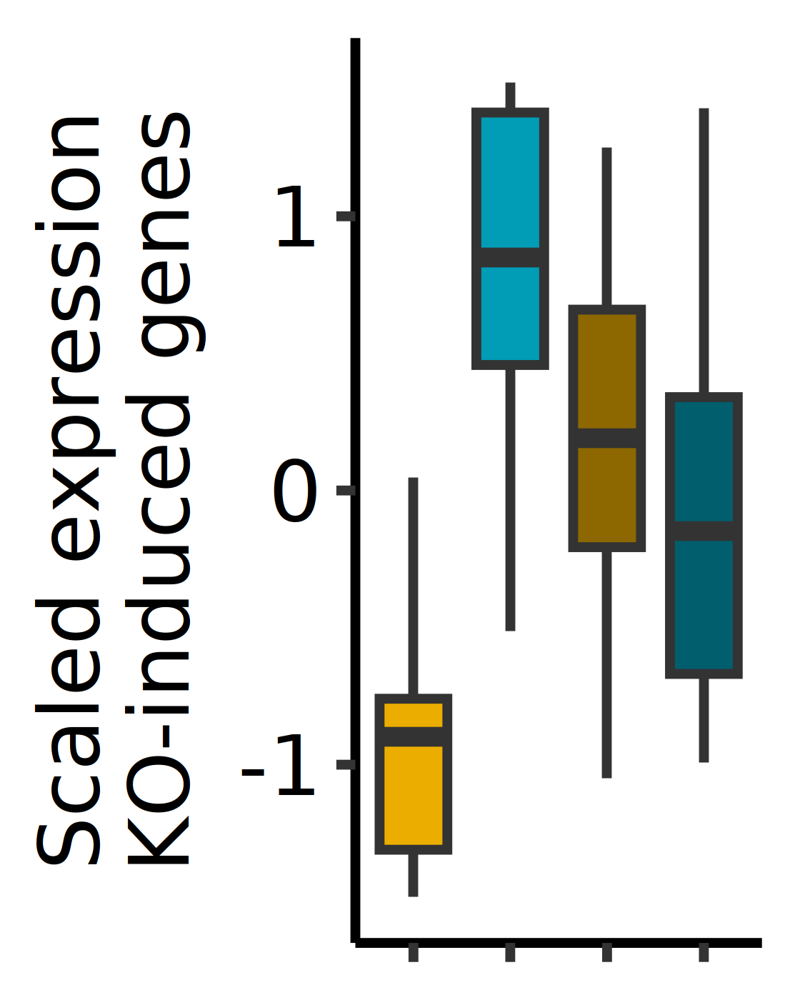

In [342]:
# Generate the plot
options(repr.plot.width=1.6, repr.plot.height=2,repr.plot.res=700)

ggplot(scale_df_L6IT_melt, aes(x=Var2, y=value,fill=Var2)) + geom_boxplot(width=0.7,outlier.size=0.1,color='grey20') + 
theme_classic() + 
theme(legend.position = 'none',
      axis.text=element_text(size=12,color='black'),
      axis.title.x=element_blank(),
      axis.title.y=element_text(size=12),
      axis.text.x=element_blank()) + 
scale_fill_manual(values=c('#EBAE00',
                          '#019CB5',
                          darken('#EBAE00',0.4,space = "HLS"),
                          darken('#019CB5',0.4,space = "HLS"))) + 
ylab('Scaled expression\nKO-induced genes')+ ylim(c(-1.5,1.5))

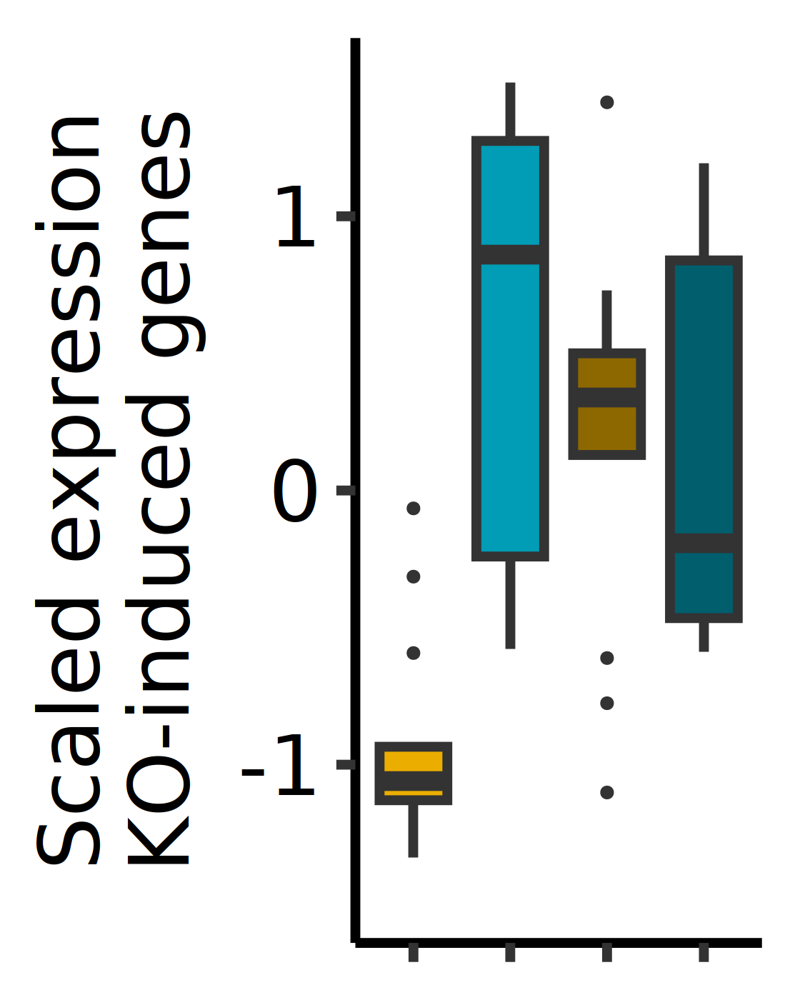

In [343]:
# Generate the plot
options(repr.plot.width=1.6, repr.plot.height=2,repr.plot.res=700)

ggplot(scale_df_L6CT_melt, aes(x=Var2, y=value,fill=Var2)) + geom_boxplot(width=0.7,outlier.size=0.1,color='grey20') + 
theme_classic() + 
theme(legend.position = 'none',
      axis.text=element_text(size=12,color='black'),
      axis.title.x=element_blank(),
      axis.title.y=element_text(size=12),
      axis.text.x=element_blank()) + 
scale_fill_manual(values=c('#EBAE00',
                          '#019CB5',
                          darken('#EBAE00',0.4,space = "HLS"),
                          darken('#019CB5',0.4,space = "HLS"))) + 
ylab('Scaled expression\nKO-induced genes')+ ylim(c(-1.5,1.5))

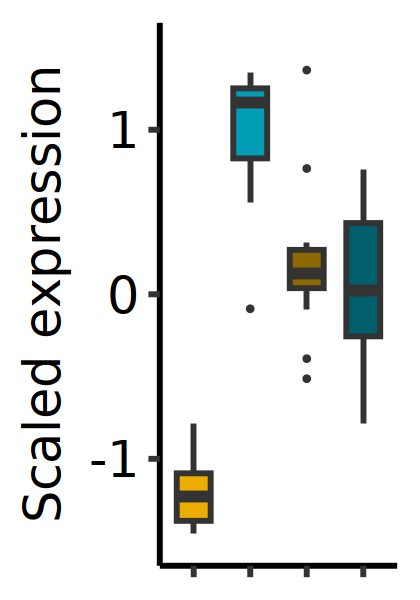

In [329]:
# Generate the plot
options(repr.plot.width=1.6, repr.plot.height=2,repr.plot.res=700)

ggplot(scale_df_L6b_melt, aes(x=Var2, y=value,fill=Var2)) + geom_boxplot(width=0.7,outlier.size=0.1,color='grey20') + 
theme_classic() + 
theme(legend.position = 'none',
      axis.text=element_text(size=12,color='black'),
      axis.title.x=element_blank(),
      axis.title.y=element_text(size=12),
      axis.text.x=element_blank()) + 
scale_fill_manual(values=c('#EBAE00',
                          '#019CB5',
                          darken('#EBAE00',0.4,space = "HLS"),
                          darken('#019CB5',0.4,space = "HLS"))) + 
ylab('Scaled expression\nKO-induced genes')+ ylim(c(-1.5,1.5))